## What I tried and what achieved

**What I tried:**
* Tried with Resnet50 and also included skip connections in it. However the result was not going beyond validation score of 36.
* Switched from Resnet50 to Densenet. Introduced bottleneck approach with increamented number of channels at the start of each block. Added another layer of convolution at the end of concatation to make the receptive field size of 64
* Tried concatenating outputs from activations, batch normalization and convolution layers respectively. However the third approach resulted in better score.
* Trained the model first on low resolution (32 x32) and then on high resolution (64x64) -- Both without augmentation until I saw a good validation accuracy (53%)
* Tried with CLR trangular and trangular2, however could not get good result. Hence droped CLR and proceeded with ReduceLROnPlateu
* Tried with Keras augmentation only and then with both keras and imgaug augmentations. However in the both cases, I could not achieve better score.
* Then I continued only with imgaug augmentations. And this time, I did the training in three sets, with each set taking updated list of class_weights and last set with heavier aumentations.
* Subsequently, I tried a number of things including Adam-W and other augmentations to increase the validation accuracy further, however no luck.
* Why additional training after the last submission? => One issue I observed was that, ReduceLRonPlateu and LR Scheduler did not work if the model was loaded using load_model. Hence I thought to run the model for one epoch just to save only the weights so that subsequently I could use LR reduction in callback. Ran the model multiple times each with updated augmentation, class_weights and LR reduction strategy.


**What I achived:**
* With training on low resolution images achieved validation accuracy of 33% (In 25 Epochs)
* Took the best weights and with further training on high resolution images, achieved validation accuracy of 53% (In additional 21 Epcohs)
* With augmentations and class_weights, achieved validation score of **62.4%** in (Effectively in additional 37 Epochs collectively from 3 sets)
* Subsequently in additional training the **validation accuracy** increased from **62.4% to 62.99%** 

**Note**
* Architecture changed from Resnet50 to **Densenet**
* **No Dropout** being used
* **No Dense** layer being used
* 1x1 **never** used to **increase** number of channels
* Number of augmentations used: **6**
* Number of model parameters **~ 7.3mn**
* **Effective number of epochs** to reach validation score of 62.4: **83** and then in further **57** epochs the accuracy reached **62.99%** ---- Hence, total number of effective epochs = **140**



## Configuration for memory usage

In [0]:
# this part will prevent tensorflow to allocate all the avaliable GPU Memory
# backend
import tensorflow as tf
from keras import backend as k

# Don't pre-allocate memory; allocate as-needed
config = tf.ConfigProto()
config.gpu_options.allow_growth = True

# Create a session with the above options specified.
k.tensorflow_backend.set_session(tf.Session(config=config))

Using TensorFlow backend.


## Download the dataset and visualize the images

In [0]:
import pandas as pd
import zipfile
from io import BytesIO
import os
import requests

TRAINING_IMAGES_DIR = r'./tiny-imagenet-200/train/'

def download_images(url):
    if (os.path.isdir(TRAINING_IMAGES_DIR)):
        print ('Images already downloaded...')
        return
    r = requests.get(url, stream=True)
    print ('Downloading ' + url )
    zip_ref = zipfile.ZipFile(BytesIO(r.content))
    zip_ref.extractall('./')
    zip_ref.close()

In [0]:
#!rm -rf "tiny-imagenet-200"           ### Run only when need to remove the downloaded images and download again

In [0]:
download_images(r"http://cs231n.stanford.edu/tiny-imagenet-200.zip")

In [0]:

from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator

### Examine Dataset

In [0]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import imageio
import numpy as np

In [0]:
TRAINING_IMAGES_DIR = r'./tiny-imagenet-200/train/'
VAL_IMAGES_DIR = './tiny-imagenet-200/val/'

def view_images(train=1, val=0):
  if train:
    if train == 1: train = 5
    for class_type in os.listdir(TRAINING_IMAGES_DIR):
      if os.path.isdir(TRAINING_IMAGES_DIR + class_type + '/images/'):
        class_dir = os.path.join(TRAINING_IMAGES_DIR, (class_type + '/images/'))
        class_images = os.listdir(class_dir)
        print("Train Class name: ", class_type)
        timages = []
        for i in range(train):
          image_file = os.path.join(class_dir, class_images[i])
          image_data = imageio.imread(image_file)
          tshape = imageio.imread(image_file).shape
          if tshape == (64, 64, 3): 
            timages.append(image_data)
          else:
            print("Training image size exception for some: ", tshape)
        imgaug.imshow(np.hstack(timages))
          
  if val:
    if val == 1: val = 5
    val_images = os.listdir(VAL_IMAGES_DIR + '/images/')
    df = pd.read_csv(r'./tiny-imagenet-200/val/val_annotations.txt', sep = '\t', header = None, names = ['id', 'class', 'x', 'y', 'w', 'h', 'd'])
    df_dict = dict(zip(df['id'].tolist(), df['class'].tolist()))
    inv_map = {}
    for k, v in df_dict.items():
      inv_map[v] = inv_map.get(v, [])
      inv_map[v].append(k)
      
    for key in inv_map.keys():
      print("Val Class: ", key)
      img_list = inv_map[key][:val]
      vimages = []
      for img in img_list:
        image_file = os.path.join(VAL_IMAGES_DIR, 'images/', img)
        image_data = imageio.imread(image_file)
        vshape = imageio.imread(image_file).shape
        if vshape == (64, 64, 3): 
          vimages.append(image_data)
        else:
          print("Validation Image size exception for some: ", vshape)
      imgaug.imshow(np.hstack(vimages))

Train Class name:  n03854065


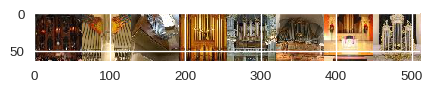

Train Class name:  n01742172


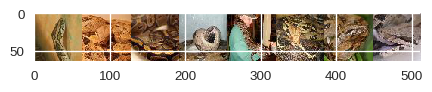

Train Class name:  n07749582


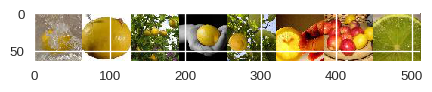

Train Class name:  n04486054


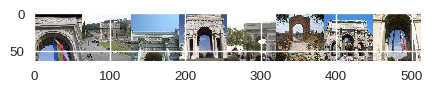

Train Class name:  n03649909


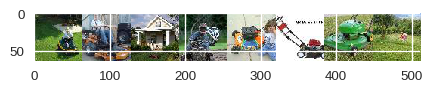

Train Class name:  n04465501


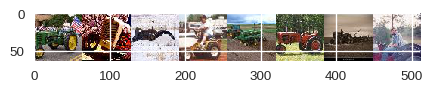

Train Class name:  n07753592


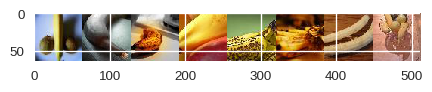

Train Class name:  n03970156


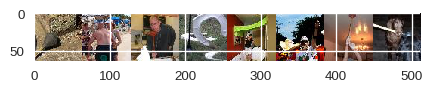

Train Class name:  n09193705


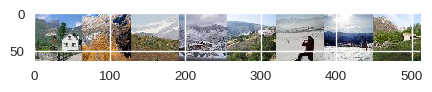

Train Class name:  n02002724


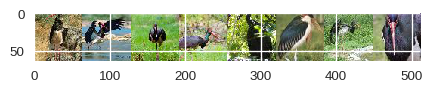

Train Class name:  n04067472


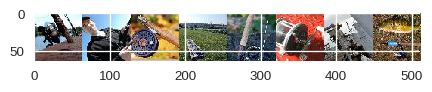

Train Class name:  n04099969


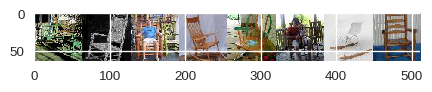

Train Class name:  n02123394


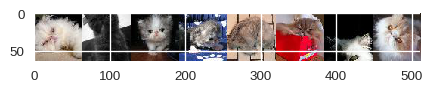

Train Class name:  n03544143
Training image size exception:  (64, 64)


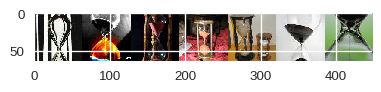

Train Class name:  n07615774


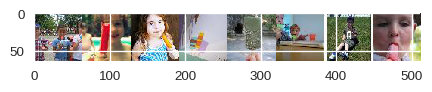

Train Class name:  n03796401


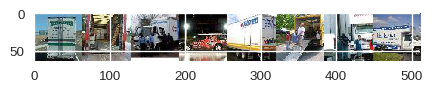

Train Class name:  n04259630


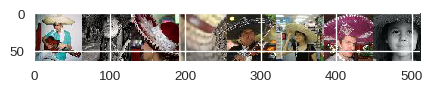

Train Class name:  n03902125


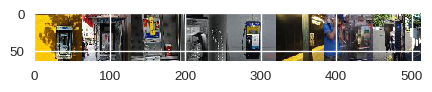

Train Class name:  n02808440


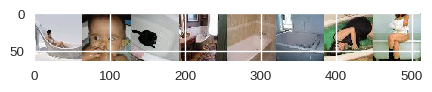

Train Class name:  n04265275


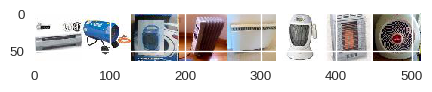

Train Class name:  n02132136


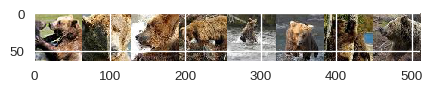

Train Class name:  n02129165


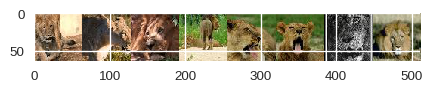

Train Class name:  n07715103


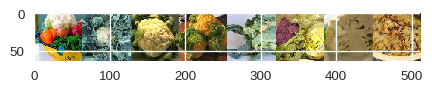

Train Class name:  n03599486
Training image size exception:  (64, 64)
Training image size exception:  (64, 64)


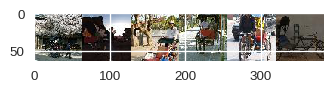

Train Class name:  n04371430


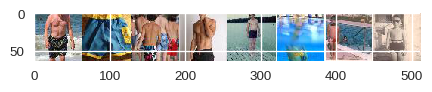

Train Class name:  n03983396


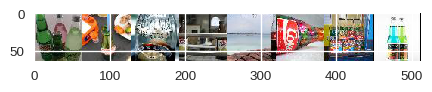

Train Class name:  n04366367
Training image size exception:  (64, 64)


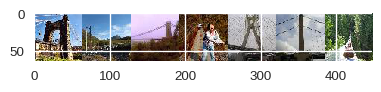

Train Class name:  n01984695


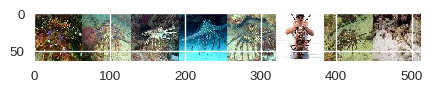

Train Class name:  n09332890


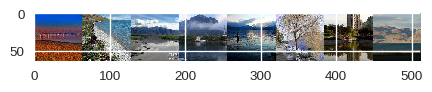

Train Class name:  n01770393


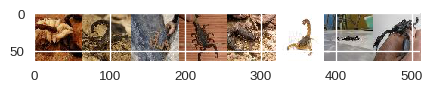

Train Class name:  n03891332


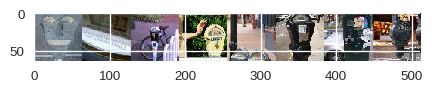

Train Class name:  n02917067


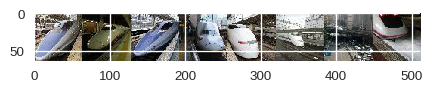

Train Class name:  n07720875


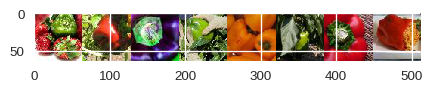

Train Class name:  n07614500


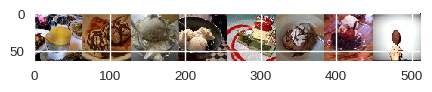

Train Class name:  n03706229


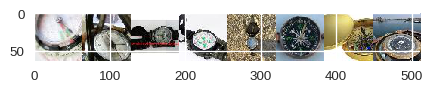

Train Class name:  n02963159


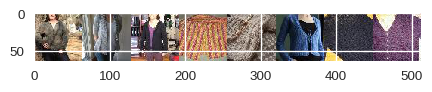

Train Class name:  n02481823
Training image size exception:  (64, 64)


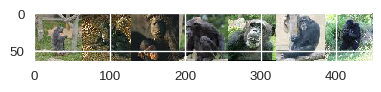

Train Class name:  n02669723
Training image size exception:  (64, 64)


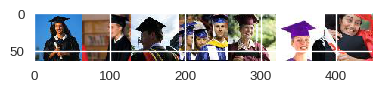

Train Class name:  n02504458


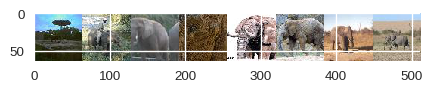

Train Class name:  n01882714
Training image size exception:  (64, 64)


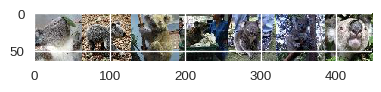

Train Class name:  n04540053


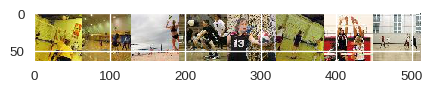

Train Class name:  n02730930


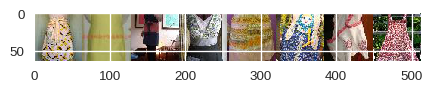

Train Class name:  n07747607


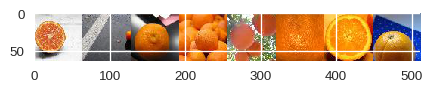

Train Class name:  n02823428


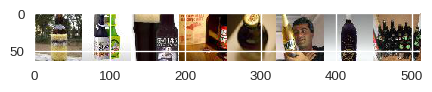

Train Class name:  n03447447


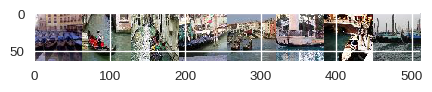

Train Class name:  n02410509


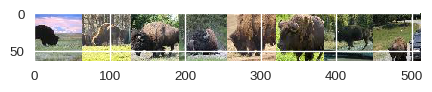

Train Class name:  n01983481


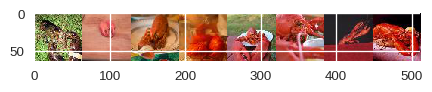

Train Class name:  n07875152


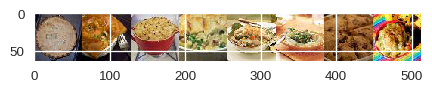

Train Class name:  n01910747


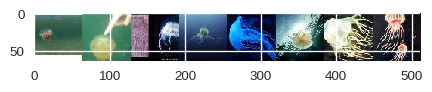

Train Class name:  n03838899


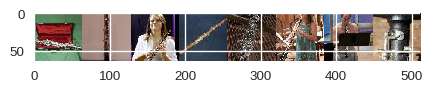

Train Class name:  n02056570


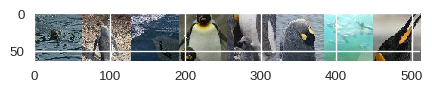

Train Class name:  n07871810


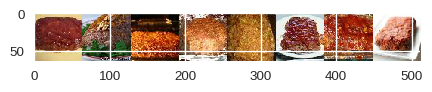

Train Class name:  n04399382


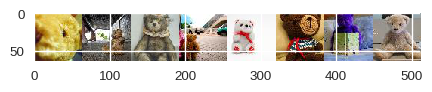

Train Class name:  n09428293
Training image size exception:  (64, 64)


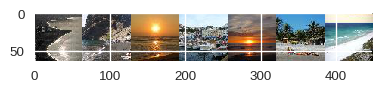

Train Class name:  n04008634
Training image size exception:  (64, 64)


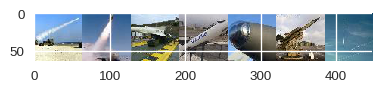

Train Class name:  n02321529


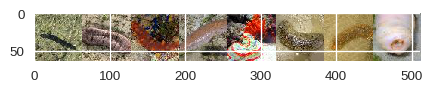

Train Class name:  n04501370
Training image size exception:  (64, 64)


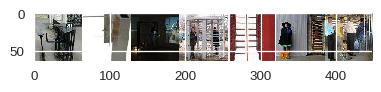

Train Class name:  n04118538


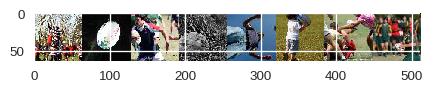

Train Class name:  n01698640


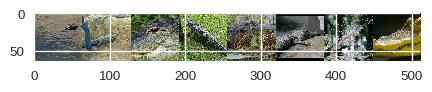

Train Class name:  n04597913


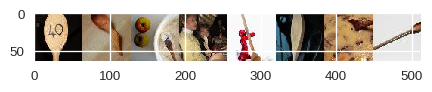

Train Class name:  n03662601


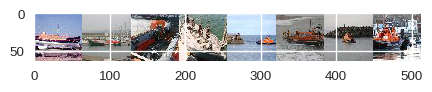

Train Class name:  n02226429


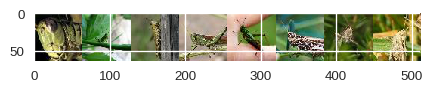

Train Class name:  n02988304


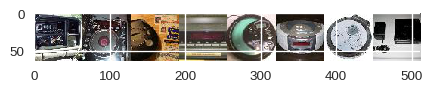

Train Class name:  n02279972


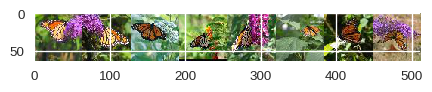

Train Class name:  n02423022


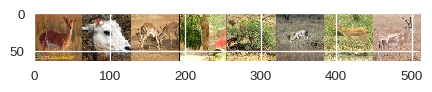

Train Class name:  n07695742


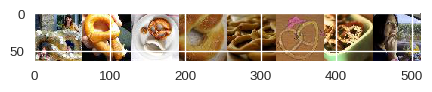

Train Class name:  n04532106


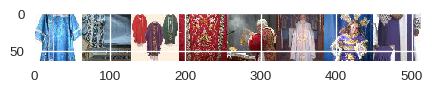

Train Class name:  n02236044


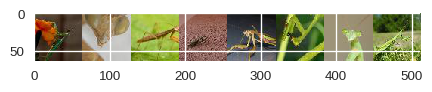

Train Class name:  n02892201


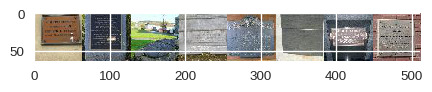

Train Class name:  n03085013


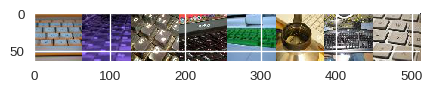

Train Class name:  n01855672


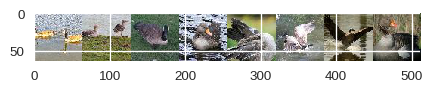

Train Class name:  n02699494


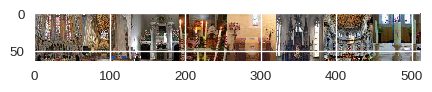

Train Class name:  n07768694


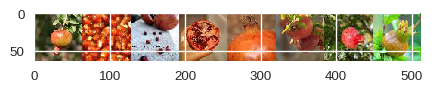

Train Class name:  n02843684


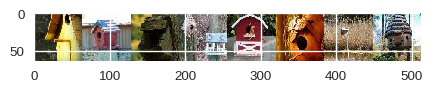

Train Class name:  n07734744


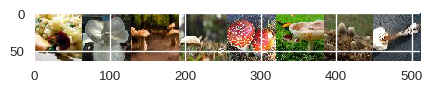

Train Class name:  n06596364


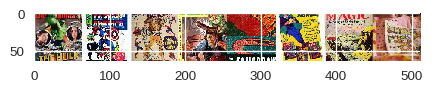

Train Class name:  n04070727


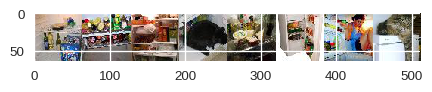

Train Class name:  n07711569


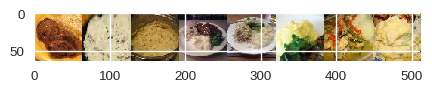

Train Class name:  n03160309


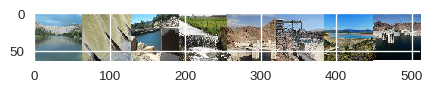

Train Class name:  n04398044


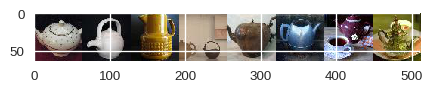

Train Class name:  n02927161


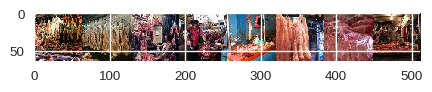

Train Class name:  n02883205
Training image size exception:  (64, 64)
Training image size exception:  (64, 64)


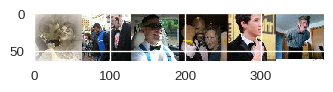

Train Class name:  n03388043


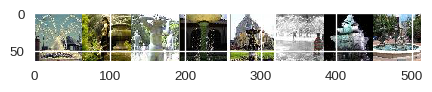

Train Class name:  n04311004
Training image size exception:  (64, 64)


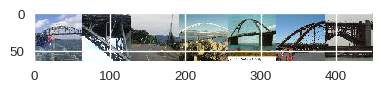

Train Class name:  n03201208


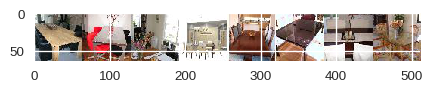

Train Class name:  n03837869


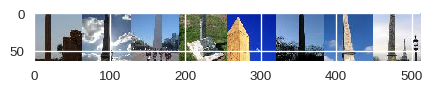

Train Class name:  n02788148
Training image size exception:  (64, 64)
Training image size exception:  (64, 64)


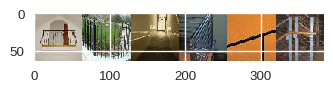

Train Class name:  n07583066


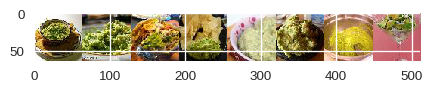

Train Class name:  n02364673
Training image size exception:  (64, 64)


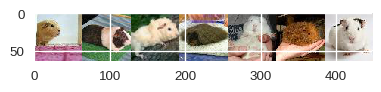

Train Class name:  n04149813


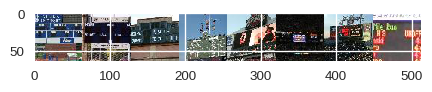

Train Class name:  n02268443


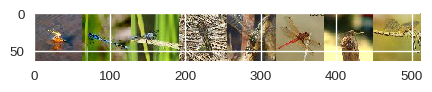

Train Class name:  n12267677


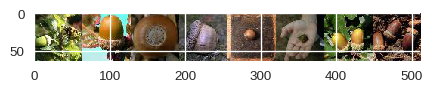

Train Class name:  n02403003


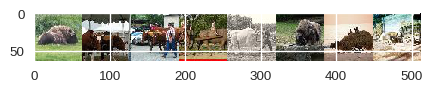

Train Class name:  n03400231


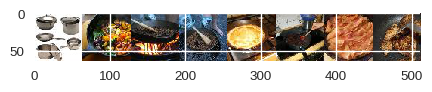

Train Class name:  n03976657


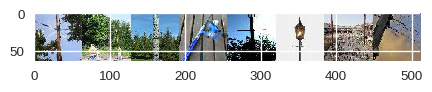

Train Class name:  n09256479


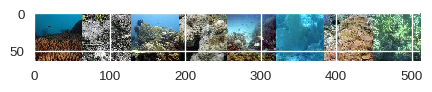

Train Class name:  n03992509


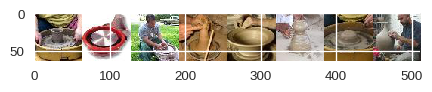

Train Class name:  n01950731


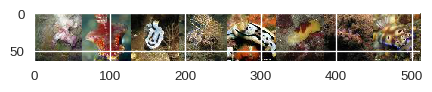

Train Class name:  n02281406


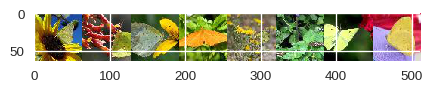

Train Class name:  n03100240


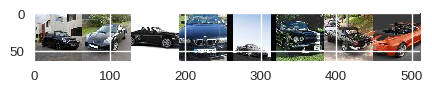

Train Class name:  n03733131


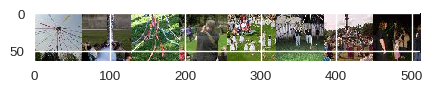

Train Class name:  n03026506


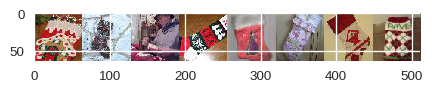

Train Class name:  n07920052
Training image size exception:  (64, 64)


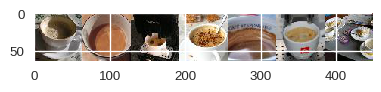

Train Class name:  n01774750


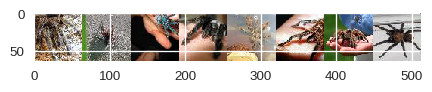

Train Class name:  n02791270


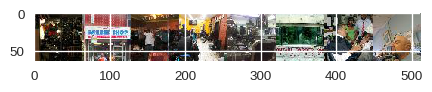

Train Class name:  n03014705


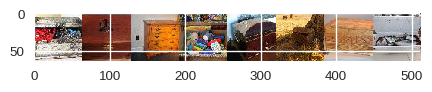

Train Class name:  n02802426


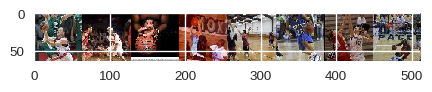

Train Class name:  n03977966


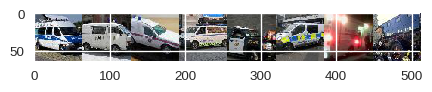

Train Class name:  n03404251


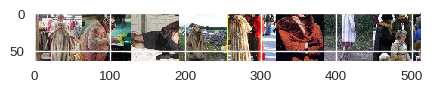

Train Class name:  n03444034


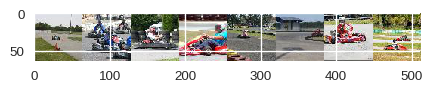

Train Class name:  n02206856


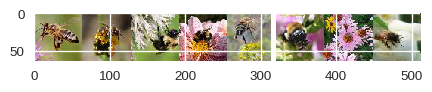

Train Class name:  n03089624


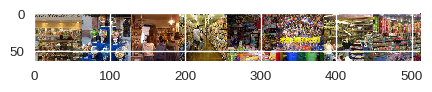

Train Class name:  n04328186


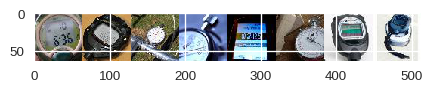

Train Class name:  n04507155
Training image size exception:  (64, 64)


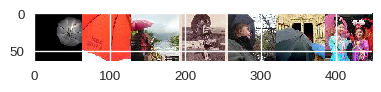

Train Class name:  n01641577


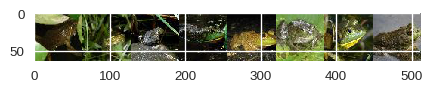

Train Class name:  n02793495
Training image size exception:  (64, 64)


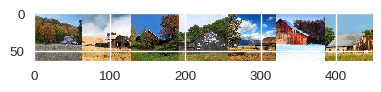

Train Class name:  n04532670


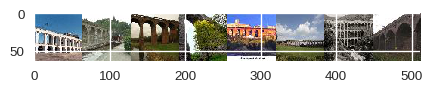

Train Class name:  n04562935


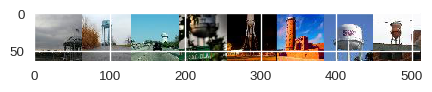

Train Class name:  n02906734


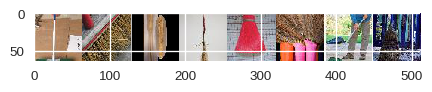

Train Class name:  n02909870
Training image size exception:  (64, 64)


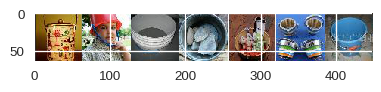

Train Class name:  n02233338


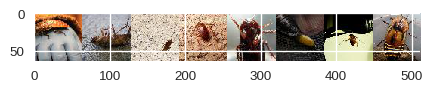

Train Class name:  n02509815


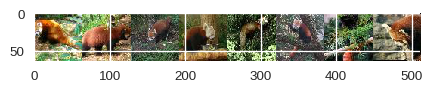

Train Class name:  n07579787


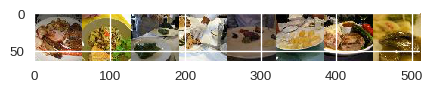

Train Class name:  n02480495
Training image size exception:  (64, 64)


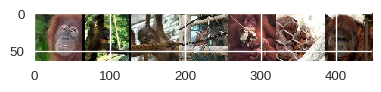

Train Class name:  n01629819


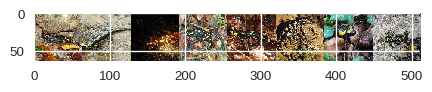

Train Class name:  n07873807


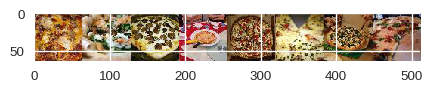

Train Class name:  n03126707


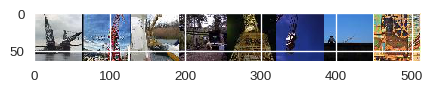

Train Class name:  n03584254


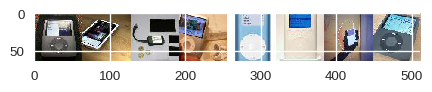

Train Class name:  n02231487


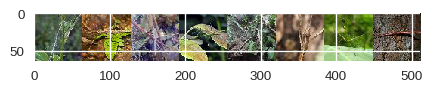

Train Class name:  n04179913


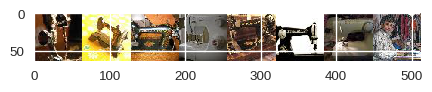

Train Class name:  n02085620


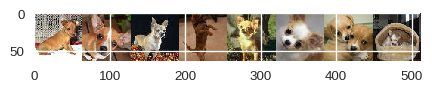

Train Class name:  n03670208


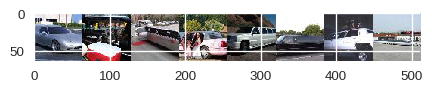

Train Class name:  n01443537


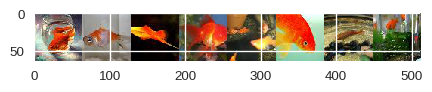

Train Class name:  n01945685


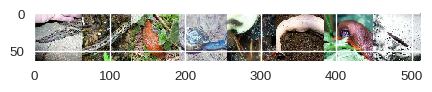

Train Class name:  n04023962


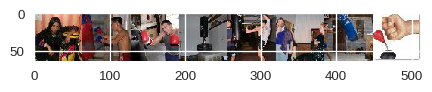

Train Class name:  n03355925


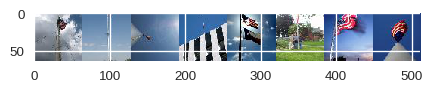

Train Class name:  n02395406


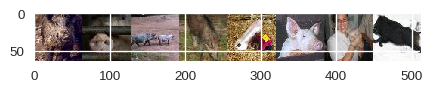

Train Class name:  n04275548


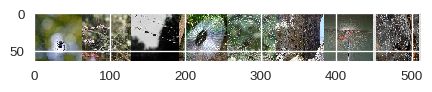

Train Class name:  n03937543


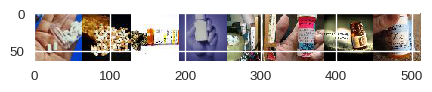

Train Class name:  n04285008


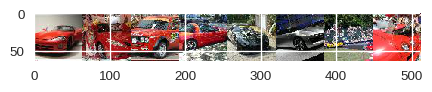

Train Class name:  n02815834
Training image size exception:  (64, 64)


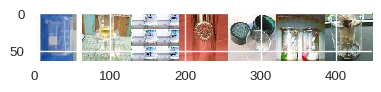

Train Class name:  n02415577


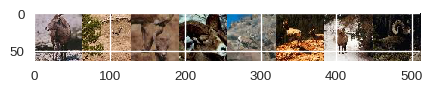

Train Class name:  n02795169


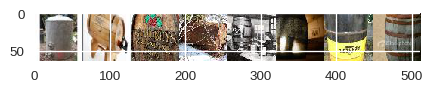

Train Class name:  n02950826
Training image size exception:  (64, 64)


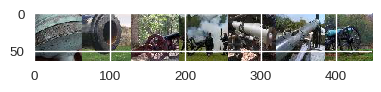

Train Class name:  n01774384


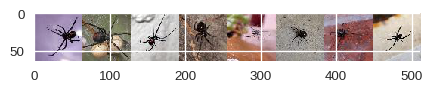

Train Class name:  n01917289


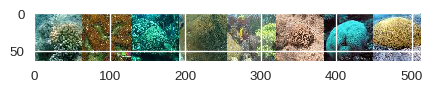

Train Class name:  n04146614


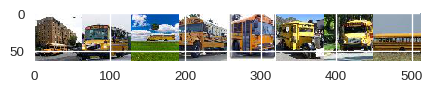

Train Class name:  n02058221


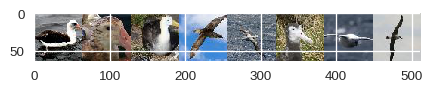

Train Class name:  n01944390


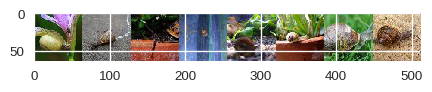

Train Class name:  n03814639


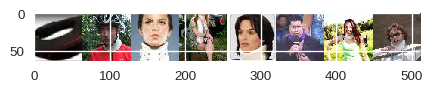

Train Class name:  n03042490


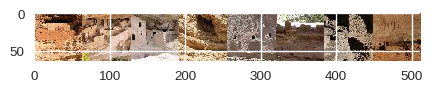

Train Class name:  n02486410


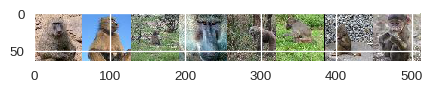

Train Class name:  n01644900


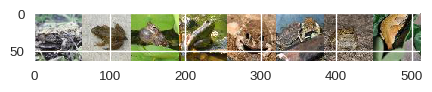

Train Class name:  n03930313
Training image size exception:  (64, 64)
Training image size exception:  (64, 64)


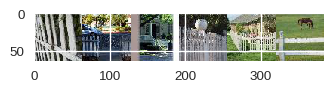

Train Class name:  n04417672


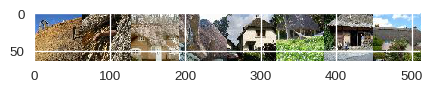

Train Class name:  n02948072


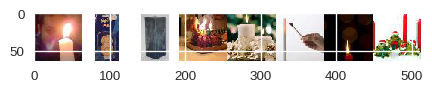

Train Class name:  n02125311


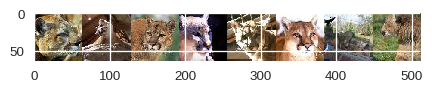

Train Class name:  n02099712
Training image size exception:  (64, 64)


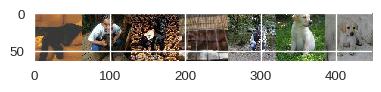

Train Class name:  n02814533


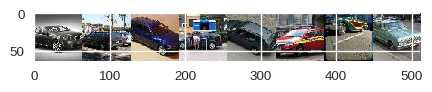

Train Class name:  n03804744
Training image size exception:  (64, 64)


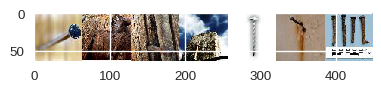

Train Class name:  n02769748


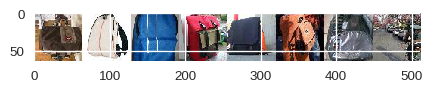

Train Class name:  n02437312


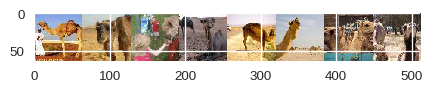

Train Class name:  n03393912


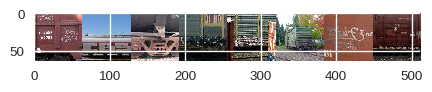

Train Class name:  n02814860


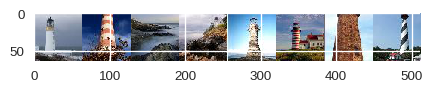

Train Class name:  n02841315


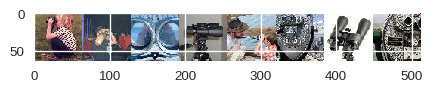

Train Class name:  n04356056


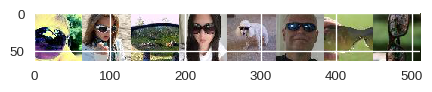

Train Class name:  n02124075


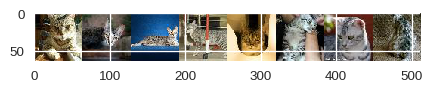

Train Class name:  n03424325
Training image size exception:  (64, 64)


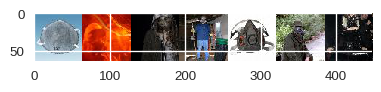

Train Class name:  n02666196


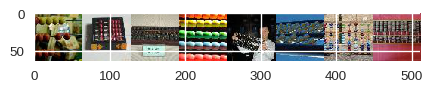

Train Class name:  n03250847


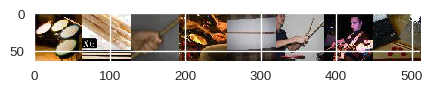

Train Class name:  n03763968
Training image size exception:  (64, 64)


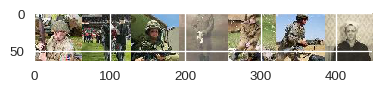

Train Class name:  n02074367


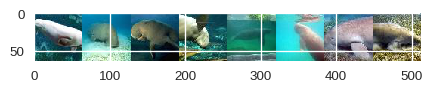

Train Class name:  n02106662


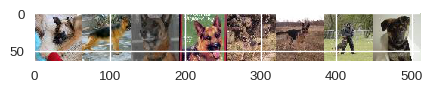

Train Class name:  n02113799


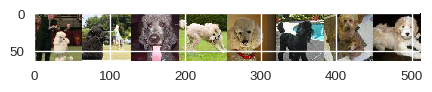

Train Class name:  n02094433


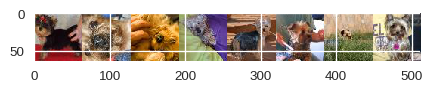

Train Class name:  n03637318


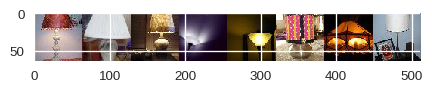

Train Class name:  n04596742


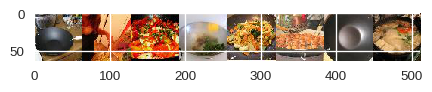

Train Class name:  n02999410


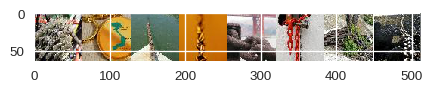

Train Class name:  n03255030
Training image size exception:  (64, 64)


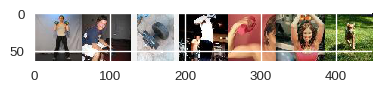

Train Class name:  n02099601


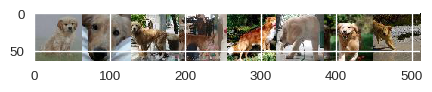

Train Class name:  n02123045


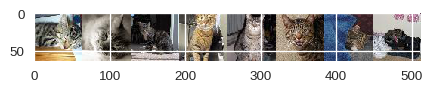

Train Class name:  n02190166


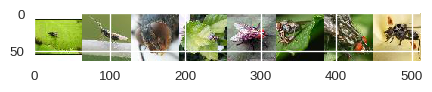

Train Class name:  n04074963


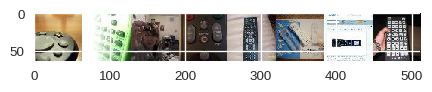

Train Class name:  n04251144


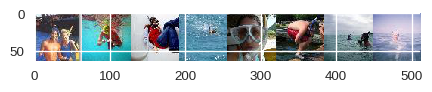

Train Class name:  n03770439


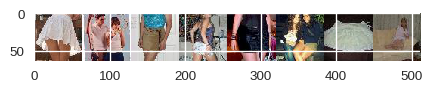

Train Class name:  n04487081


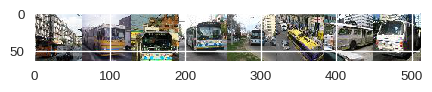

Train Class name:  n02165456


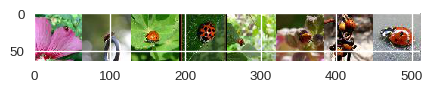

Train Class name:  n04456115


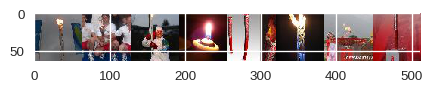

Train Class name:  n02837789


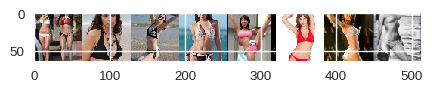

Train Class name:  n04133789


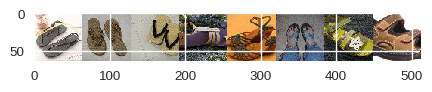

Train Class name:  n09246464


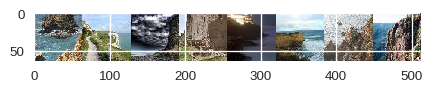

Train Class name:  n03179701


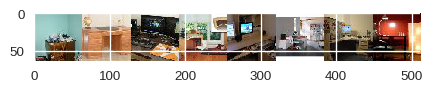

Train Class name:  n03617480


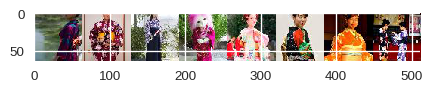

Train Class name:  n04254777


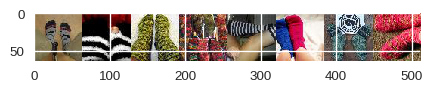

Train Class name:  n03980874


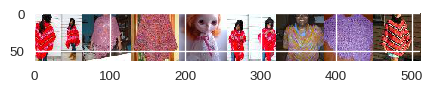

Train Class name:  n01784675


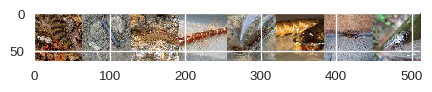

Train Class name:  n04376876


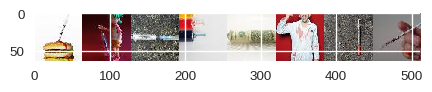

Train Class name:  n04560804


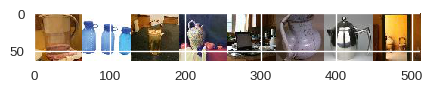

Train Class name:  n01768244


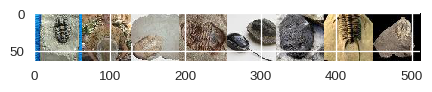

Train Class name:  n02977058


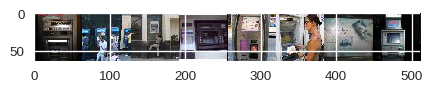

In [0]:
view_images(train = 8, val = 0)

## Variables

In [0]:
target_size_v = 64
batch_size_v = 200

## Data Loading using data generator

In [0]:
#train_datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=seq.augment_image, horizontal_flip=True, rotation_range=60, zoom_range=0.4, width_shift_range=0.3, height_shift_range=0.3, fill_mode = "nearest")
#train_datagen = ImageDataGenerator(rescale=1./255)
#train_datagen = ImageDataGenerator(horizontal_flip=True, rotation_range=60, zoom_range=0.4)
train_datagen = ImageDataGenerator(rescale=1./255)

In [0]:
batch_size_v = 200         #Added again for ease of handling during OOM error

In [0]:
train_generator = train_datagen.flow_from_directory(
    directory=TRAINING_IMAGES_DIR,
    target_size=(target_size_v, target_size_v),
    color_mode="rgb",
    batch_size=batch_size_v,
    class_mode="categorical",
    shuffle=True)

class_dict = train_generator.class_indices


Found 100000 images belonging to 200 classes.


In [0]:
VAL_IMAGES_DIR = './tiny-imagenet-200/val/images'
df = pd.read_csv(r'./tiny-imagenet-200/val/val_annotations.txt', sep = '\t', header = None, names = ['id', 'class', 'x', 'y', 'w', 'h', 'd'])

val_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = val_datagen.flow_from_dataframe(dataframe=df, 
                                                     directory=VAL_IMAGES_DIR, 
                                                     x_col="id", y_col="class", 
                                                     class_mode="categorical",    #bbc -> seems to be a keras issue when "other" is used with y_col = class_idx
                                                     target_size=(64, 64), 
                                                     batch_size=batch_size_v,
                                                     shuffle=True)

Found 10000 images belonging to 200 classes.


## Define DenseNet Model

In [0]:
from __future__ import division

import six
from keras.models import Model
from keras.layers import (
    Input,
    Activation,
    Dense,
    Flatten,
    Reshape,
    Lambda
)
from keras.layers.convolutional import (
    Conv2D,
    MaxPooling2D,
    AveragePooling2D,
    SeparableConv2D
)
from keras.layers.merge import add
from keras.regularizers import l2
from keras import backend as K
from keras.layers import concatenate
from keras.models import Model
from keras.layers.core import Dense, Dropout, Activation
from keras.layers.convolutional import Convolution2D
from keras.layers.pooling import AveragePooling2D
from keras.layers.pooling import GlobalAveragePooling2D
from keras.layers import Input, merge
from keras.layers.normalization import BatchNormalization
from keras.regularizers import l2
import keras.backend as K
from keras.callbacks import ReduceLROnPlateau, LearningRateScheduler

In [0]:
weight_decay = 1E-4
concat_axis = -1

def conv_block(ip, nb_filter, dropout_rate=None, weight_decay=weight_decay):
    x = BatchNormalization(axis=concat_axis, gamma_regularizer=l2(weight_decay), beta_regularizer=l2(weight_decay))(ip)
    x = Activation('relu')(x)
    x = Conv2D(nb_filter, kernel_size = (3, 3), kernel_initializer="he_normal",  padding="same", kernel_regularizer=l2(weight_decay))(x)
                      
    if dropout_rate: x = Dropout(dropout_rate)(x)

    return x


  
def transition_block(ip, nb_filter, bottleneck, dropout_rate=None, weight_decay=weight_decay):
    print("Before 3x3, number of channels in transition: ", nb_filter)
    x = Conv2D(nb_filter, kernel_size = (3, 3), kernel_initializer="he_normal",  padding="same", kernel_regularizer=l2(weight_decay))(ip)
    print("After 3x3, number of channels in transition: ", x.shape[-1])
    
    if dropout_rate: x = Dropout(dropout_rate)(x)
    x = AveragePooling2D((2, 2), strides=(2, 2))(x)
    
    x = BatchNormalization(axis=concat_axis, gamma_regularizer=l2(weight_decay), beta_regularizer=l2(weight_decay))(x)
    x = Activation('relu')(x)
    
    print("Before 1x1, number of channels in transition: ", x.shape[-1])
    x = Conv2D(bottleneck, kernel_size = (1, 1), kernel_initializer="he_normal",  padding="same", kernel_regularizer=l2(weight_decay))(x)
    print("After 1x1, number of channels in transition: ", x.shape[-1])

    return x


def dense_block(x, nb_layers, nb_filter, growth_rate, dropout_rate=None, weight_decay=1E-4):

    feature_list = [x]

    for i in range(nb_layers):
        x = conv_block(x, nb_filter, dropout_rate, weight_decay)
        feature_list.append(x)
        x = concatenate(feature_list)
        nb_filter *= growth_rate
    
    print("Number of filter after concatenation: ", nb_filter)
    print("Size of concatenated X: ", x.shape[-1])

    return x, nb_filter      # changed from nb_filter to b_filter

  
  
def create_dense_net(nb_classes, img_dim, depth=13, nb_dense_block=3, growth_rate=2, nb_filter=32, dropout_rate=None,
                     weight_decay=1E-4, verbose=True):

    if K.image_dim_ordering() == 'tf':
      img_dim = (img_dim[1], img_dim[2], img_dim[0])
    
    model_input = Input(shape=img_dim)

    concat_axis = -1
    
    assert (depth - 4) % 3 == 0, "Depth must be 3 N + 4"

    # layers in each dense block
    nb_layers = int((depth - 4) / 3)

    # Initial convolutions
    x = Conv2D(nb_filter, kernel_size = (3, 3), kernel_initializer="he_normal",  padding="same", kernel_regularizer=l2(weight_decay))(model_input)
    print("Number of channels after first convolution: ", x.shape[-1])

    # Add dense blocks
    bottleneck = nb_filter
    for block_idx in range(nb_dense_block - 1):
      nb_filter = bottleneck
      print("Start -- Number of filters for block:", block_idx, " => ", nb_filter)
      x, nb_filter = dense_block(x, nb_layers, nb_filter, growth_rate, dropout_rate=dropout_rate, weight_decay=weight_decay)
      print("End -- Number of filters for block:", block_idx, " => ", nb_filter)
      
      bottleneck *= 2
      print("For block ", block_idx, " bottleneck set to: ", bottleneck)
      x = transition_block(x, nb_filter, bottleneck = bottleneck, dropout_rate=dropout_rate, weight_decay=weight_decay)
      print("For block ", block_idx, " after transition channels: ", x.shape[-1])


    # The last dense_block does not have a transition_block
    nb_filter = bottleneck
    print("Number of filters for last block - start :", nb_filter)
    x, nb_filter = dense_block(x, nb_layers, nb_filter, growth_rate, dropout_rate=dropout_rate,
                               weight_decay=weight_decay)
    print("Number of filters at the end of last block:", nb_filter)
    
    
    # For last block
    x = BatchNormalization(axis=concat_axis, gamma_regularizer=l2(weight_decay), beta_regularizer=l2(weight_decay))(x)
    x = Activation('relu')(x)
    
    
    # Reduce number of channels to number of outputs
    x = Conv2D(nb_classes, kernel_size = (1, 1), kernel_initializer="he_normal",  padding="same", kernel_regularizer=l2(weight_decay))(x)
    x = BatchNormalization(axis=concat_axis, gamma_regularizer=l2(weight_decay), beta_regularizer=l2(weight_decay))(x)
    x = Activation('relu')(x)
    
    # Global average pooling to handle images of any size as well to get rid of dense
    x = GlobalAveragePooling2D()(x)

    output = Activation('softmax')(x)
    densenet = Model(inputs=model_input, outputs=output, name="create_dense_net")

    if verbose: print("DenseNet-%d-%d created." % (depth, growth_rate))

    return densenet
  
DIM_ORDERING = 'tf'
K.set_image_dim_ordering(DIM_ORDERING)

## Build and Compile Model

In [0]:
model = create_dense_net(200, (3, None, None))

Instructions for updating:
Colocations handled automatically by placer.
Number of channels after first convolution:  32
Start -- Number of filters for block: 0  =>  32
Number of filter after concatenation:  256
Size of concatenated X:  256
End -- Number of filters for block: 0  =>  256
For block  0  bottleneck set to:  64
Before 3x3, number of channels in transition:  256
After 3x3, number of channels in transition:  256
Before 1x1, number of channels in transition:  256
After 1x1, number of channels in transition:  64
For block  0  after transition channels:  64
Start -- Number of filters for block: 1  =>  64
Number of filter after concatenation:  512
Size of concatenated X:  512
End -- Number of filters for block: 1  =>  512
For block  1  bottleneck set to:  128
Before 3x3, number of channels in transition:  512
After 3x3, number of channels in transition:  512
Before 1x1, number of channels in transition:  512
After 1x1, number of channels in transition:  128
For block  1  after tra

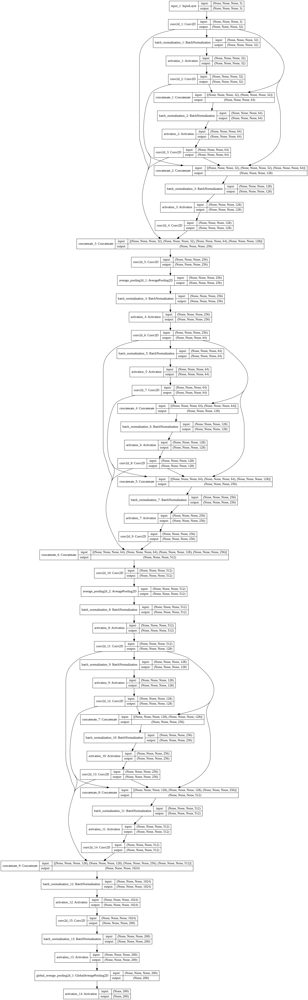

In [0]:
from keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True, to_file='model.png')
from IPython.display import Image
Image(retina=True, filename='model.png')


In [0]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 896         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 128         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, None, None, 3 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

In [0]:
from keras.optimizers import Adam
from keras import optimizers
#adam = Adam(lr=0.1, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)   # With reduced learning rate
sgd = optimizers.SGD(lr=0.1, momentum=0.9, decay=1e-4, nesterov=False)             # Changed to sgd
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr
lr_metric = get_lr_metric(sgd)

#model.compile(loss="categorical_crossentropy", optimizer=Adam(), metrics=['accuracy'])
model.compile(loss="categorical_crossentropy", optimizer=sgd, metrics=['accuracy', lr_metric])            #bbc: changed: reduced the learning rate

## Reduce LR using ReduceLROnPlateau

In [0]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.001)

## Checkpoint to save model and weights to Google Drive

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
!pip install -q h5py pyyaml
from keras.models import model_from_json

In [0]:
!ls "/content/gdrive/My Drive/EIP"

123C19	123C20	123C21	123C22


In [0]:
from keras.callbacks import *
#filepath="/content/gdrive/My Drive/EIP/123C21/epochs:{epoch:03d}-val_acc:{val_acc:.4f}.hdf5"
filepath="/content/gdrive/My Drive/EIP/123C22/epochs:{epoch:03d}-val_acc:{val_acc:.4f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto')
#checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')


In [0]:
#callbacks_list = [checkpoint, clr_triangular]
callbacks_list = [checkpoint]
#callbacks_list = [checkpoint, reduce_lr]

## Model Training Before Augmentation

### First set of Epochs - Training on low resolution (32x32)  -- Best weights taken from 25th Epoch

**To start with no augmentation. Model is being trained on 32x32 image and validated against 64x64 image size.**

In [0]:

STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=50,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        verbose=1)

Instructions for updating:
Use tf.cast instead.
Epoch 1/50
195/195 [==============================] - 354s 2s/step - loss: 5.3928 - acc: 0.1025 - lr: 0.1000 - val_loss: 5.5614 - val_acc: 0.0733 - val_lr: 0.1000

Epoch 00001: val_acc improved from -inf to 0.07329, saving model to /content/gdrive/My Drive/EIP/123C19/epochs:001-val_acc:0.0733.hdf5
Epoch 2/50
195/195 [==============================] - 332s 2s/step - loss: 4.6012 - acc: 0.2039 - lr: 0.1000 - val_loss: 5.4883 - val_acc: 0.0756 - val_lr: 0.1000

Epoch 00002: val_acc improved from 0.07329 to 0.07557, saving model to /content/gdrive/My Drive/EIP/123C19/epochs:002-val_acc:0.0756.hdf5
Epoch 3/50
195/195 [==============================] - 315s 2s/step - loss: 4.1411 - acc: 0.2695 - lr: 0.1000 - val_loss: 4.8859 - val_acc: 0.1491 - val_lr: 0.1000

Epoch 00003: val_acc improved from 0.07557 to 0.14914, saving model to /content/gdrive/My Drive/EIP/123C19/epochs:003-val_acc:0.1491.hdf5
Epoch 4/50
195/195 [=============================

### Second set of Epochs - Training on high resolution (64x64) -- Best weights taken from 21st Epoch

**Take the best model weights from the first set of epochs and train the model further but on image size of 64x64. And, validation image size remain the same. No augmentation is applied as of now, until we see good progress in the training and validation accuracy.**

In [0]:
last_best_weights = r"/content/gdrive/My Drive/EIP/123C19/epochs:025-val_acc:0.3329.hdf5"

model.load_weights(last_best_weights)

model.compile(loss="categorical_crossentropy", optimizer=sgd, metrics=['accuracy', lr_metric])            #bbc: changed: reduced the learning rate

In [0]:
batch_size_v = 128         #Added again for ease of handling during OOM error

train_generator = train_datagen.flow_from_directory(
    directory=TRAINING_IMAGES_DIR,
    target_size=(64, 64),
    color_mode="rgb",
    batch_size=batch_size_v,
    class_mode="categorical",
    shuffle=True)

VAL_IMAGES_DIR = './tiny-imagenet-200/val/images'
df = pd.read_csv(r'./tiny-imagenet-200/val/val_annotations.txt', sep = '\t', header = None, names = ['id', 'class', 'x', 'y', 'w', 'h', 'd'])
class_dict = train_generator.class_indices

val_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = val_datagen.flow_from_dataframe(dataframe=df, 
                                                     directory=VAL_IMAGES_DIR, 
                                                     x_col="id", y_col="class", 
                                                     class_mode="categorical",    #bbc -> seems to be a keras issue when "other is used" with y_col = class_idx
                                                     target_size=(64, 64), 
                                                     batch_size=batch_size_v,
                                                     shuffle=True)

Found 100000 images belonging to 200 classes.
Found 10000 images belonging to 200 classes.


In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=50,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        verbose=1)

Epoch 1/50
781/781 [==============================] - 1091s 1s/step - loss: 2.9700 - acc: 0.5057 - lr: 0.0010 - val_loss: 3.0426 - val_acc: 0.4632 - val_lr: 0.0010

Epoch 00001: val_acc improved from 0.33295 to 0.46324, saving model to /content/gdrive/My Drive/EIP/123C19/epochs:001-val_acc:0.4632.hdf5
Epoch 2/50
781/781 [==============================] - 1075s 1s/step - loss: 2.7603 - acc: 0.5454 - lr: 0.0010 - val_loss: 2.9659 - val_acc: 0.4833 - val_lr: 0.0010

Epoch 00002: val_acc improved from 0.46324 to 0.48329, saving model to /content/gdrive/My Drive/EIP/123C19/epochs:002-val_acc:0.4833.hdf5
Epoch 3/50
781/781 [==============================] - 1069s 1s/step - loss: 2.6792 - acc: 0.5619 - lr: 0.0010 - val_loss: 2.9202 - val_acc: 0.4879 - val_lr: 0.0010

Epoch 00003: val_acc improved from 0.48329 to 0.48795, saving model to /content/gdrive/My Drive/EIP/123C19/epochs:003-val_acc:0.4879.hdf5
Epoch 4/50
781/781 [==============================] - 1071s 1s/step - loss: 2.6235 - acc: 0

### Load the best weights and make prediction to get class_weights

**Take the best model weights obtained so far and make the prediction to observe which classes are being classified well and which are not, based on the precision score. For the low precision score, class weights are adjusted accordingly so as to train more on the corresponding images in the next set of epochs.**

In [0]:
from keras import optimizers

sgd = optimizers.SGD(lr=0.1, momentum=0.9, decay=1e-4, nesterov=False)  

def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)


last_best_weights = r"/content/gdrive/My Drive/EIP/123C19/epochs:021-val_acc:0.5326.hdf5"

model.load_weights(last_best_weights)

model.compile(loss="categorical_crossentropy", optimizer=sgd, metrics=['accuracy', lr_metric]) 

In [0]:
VAL_IMAGES_DIR = './tiny-imagenet-200/val/images'
df = pd.read_csv(r'./tiny-imagenet-200/val/val_annotations.txt', sep = '\t', header = None, names = ['id', 'class', 'x', 'y', 'w', 'h', 'd'])
class_dict = train_generator.class_indices

val_datagen = ImageDataGenerator(rescale=1./255)
batch_size_v = 200
validation_generator = val_datagen.flow_from_dataframe(dataframe=df, 
                                                     directory=VAL_IMAGES_DIR, 
                                                     x_col="id", y_col="class", 
                                                     class_mode="categorical",    #bbc -> seems to be a keras issue when "other is used" with y_col = class_idx
                                                     target_size=(64, 64), 
                                                     batch_size=batch_size_v,
                                                     shuffle=False)

class_dict = validation_generator.class_indices

Found 10000 images belonging to 200 classes.


In [0]:
df['Label'] = df['class'].map(class_dict)
df.head()

,id,class,x,y,w,h,d,Label
0,val_0.JPEG,n03444034,0,32,44,62,NaN,107
1,val_1.JPEG,n04067472,52,55,57,59,NaN,139
2,val_2.JPEG,n04070727,4,0,60,55,NaN,140
3,val_3.JPEG,n02808440,3,3,63,63,NaN,69
4,val_4.JPEG,n02808440,9,27,63,48,NaN,69


In [0]:
from sklearn import metrics
from sklearn.metrics import classification_report
import numpy as np

STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model_score = model.evaluate_generator(validation_generator, steps = STEP_SIZE_VALID, verbose = True)
print(model.metrics_names)
print(model_score)


Y_pred = model.predict_generator(validation_generator, steps = STEP_SIZE_VALID, verbose = True)
y_pred = np.argmax(Y_pred, axis=1)

score = metrics.precision_recall_fscore_support(validation_generator.classes, y_pred)
precision_dict = {
             "precision" :score[0].round(6)
            }

pred_df = pd.DataFrame(precision_dict, index = validation_generator.class_indices).reset_index()


50/50 [==============================] - 46s 927ms/step
['loss', 'acc', 'lr']
[2.7207252836227416, 0.5298999977111817, 0.10000000149011612]
50/50 [==============================] - 35s 703ms/step


In [0]:
pred_df['Label'] = pred_df['index'].map(class_dict)

In [0]:
pred_df["weight"] = 1 - pred_df["precision"]
class_weights_dict = dict(zip(pred_df["Label"].tolist(), pred_df["weight"].tolist()))
class_weights_dict

{0: 1.0,
 1: 1.0,
 2: 1.0,
 3: 1.0,
 4: 1.0,
 5: 0.978723,
 6: 1.0,
 7: 1.0,
 8: 1.0,
 9: 1.0,
 10: 1.0,
 11: 1.0,
 12: 1.0,
 13: 0.981132,
 14: 0.978723,
 15: 1.0,
 16: 0.979167,
 17: 1.0,
 18: 1.0,
 19: 1.0,
 20: 0.98,
 21: 1.0,
 22: 0.98,
 23: 1.0,
 24: 1.0,
 25: 1.0,
 26: 1.0,
 27: 1.0,
 28: 0.971429,
 29: 1.0,
 30: 1.0,
 31: 0.983051,
 32: 1.0,
 33: 1.0,
 34: 1.0,
 35: 1.0,
 36: 1.0,
 37: 0.9767440000000001,
 38: 1.0,
 39: 1.0,
 40: 1.0,
 41: 1.0,
 42: 0.979592,
 43: 1.0,
 44: 1.0,
 45: 1.0,
 46: 1.0,
 47: 1.0,
 48: 1.0,
 49: 0.973684,
 50: 1.0,
 51: 1.0,
 52: 1.0,
 53: 1.0,
 54: 1.0,
 55: 1.0,
 56: 1.0,
 57: 1.0,
 58: 1.0,
 59: 1.0,
 60: 1.0,
 61: 1.0,
 62: 1.0,
 63: 1.0,
 64: 1.0,
 65: 1.0,
 66: 1.0,
 67: 1.0,
 68: 0.980392,
 69: 1.0,
 70: 1.0,
 71: 0.981132,
 72: 1.0,
 73: 1.0,
 74: 1.0,
 75: 1.0,
 76: 0.980392,
 77: 1.0,
 78: 1.0,
 79: 1.0,
 80: 1.0,
 81: 1.0,
 82: 1.0,
 83: 0.972973,
 84: 0.979167,
 85: 1.0,
 86: 1.0,
 87: 1.0,
 88: 1.0,
 89: 0.981481,
 90: 1.0,
 91: 1.0,
 92

**Note: The following code is to find out exact images with their prediction result for futher granular level study for necessary augmentation. However the code is failing because of unusual return of number of classes. For now, it can be ignored, as I manually checked class level images.**

In [0]:
#pred_df
batch_size_v = 200
STEP_SIZE_VALID = 50
class_score = {}
df_list = []
val_img_path = r'content/tiny-imagenet-200/val/images'
for l in df['Label'].tolist():
  df_temp = df[df['Label'] == l]
  validation_generator = val_datagen.flow_from_dataframe(dataframe=df_temp, 
                                                       directory=VAL_IMAGES_DIR, 
                                                       x_col="id", y_col="Label", 
                                                       class_mode=None,    #bbc -> seems to be a keras issue when "other is used" with y_col = class_idx
                                                       target_size=(64, 64),
                                                      batch_size=df_temp.shape[0])
  validation_generator.reset()
  #preds = model.predict_generator(validation_generator, steps = df_temp.shape[0], verbose = True)
  preds = model.predict(validation_generator, steps = df_temp.shape[0], verbose = True)

  #filenames=validation_generator.filenames
  #for file in filenames:
  #  file = os.path.join(val_img_path, file)
  #  print(file)
    
  preds = model.predict(filenames, verbose = True)
  print(len(preds))
  predicted_class_indices=np.argmax(preds,axis=1)
  print("length of preds", len(predicted_class_indices))
  labels = (train_generator.class_indices)
  labels = dict((v,k) for k,v in labels.items())
  predictions = [labels[k] for k in predicted_class_indices]
  print("filenames length: ", len(filenames))
  print(filenames)
  print("filenames predictions: ", len(predictions))
  print(predictions)
  #results=pd.DataFrame({"Filename":filenames,
  #                      "Predictions":predictions})
  #df_list.append(results)

#df_pred = pd.concat(df_list)
  #results.to_csv("results.csv",index=False)
  #class_score[l] = model_score[1]


Found 50 images.


AttributeError: ignored

## Model Training After Augmentation

### Training with Only Imgaug augmentation

####Augmentation

In [0]:
from imgaug import augmenters as iaa
import imgaug
import os
import imageio
import numpy as np
from scipy import misc

In [0]:
target_size_v = 64

In [0]:
seq = iaa.Sequential([iaa.SomeOf((0, 3), [
      iaa.Fliplr(1),
      iaa.CoarseDropout(0.03, size_percent=(0.10, 0.35)),
      iaa.Noop(),
      iaa.Crop(percent=(0, 0.10)),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Noop(),
      iaa.Noop(),
      #iaa.Affine(rotate=(-30,30)),
      iaa.Noop(),
      iaa.CropAndPad(percent=(-0.20, 0.20), keep_size=True),
      iaa.CoarseDropout(0.03, size_percent=(0.10, 0.35)),
      iaa.Noop(),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Noop(),
      #iaa.Sharpen(alpha=(0,0.3), lightness=(0, 1.5)),
      #iaa.AverageBlur(k=(1, 3)),
      iaa.Noop(),
      iaa.Add((-40,40), per_channel=0.5),
      #iaa.Multiply((0.5, 1.0)),
      iaa.Noop(),
      iaa.CoarseDropout(0.03, size_percent=(0.10, 0.35)),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Noop()
      ], random_order=True), iaa.Resize({"height": target_size_v, "width": target_size_v})], random_order=False)

In [0]:
#train_datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=seq.augment_image, horizontal_flip=True, rotation_range=60, zoom_range=0.4, width_shift_range=0.3, height_shift_range=0.3, fill_mode = "nearest")
train_datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=seq.augment_image)


In [0]:
batch_size_v = 200
train_generator = train_datagen.flow_from_directory(
    directory=TRAINING_IMAGES_DIR,
    target_size=(target_size_v, target_size_v),
    color_mode="rgb",
    batch_size=batch_size_v,
    class_mode="categorical",
    shuffle=True)

Found 100000 images belonging to 200 classes.


#### Third set of Epochs (Best model taken from 19th Epoch)

In [0]:

STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=30,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        class_weight = class_weights_dict,
        verbose=1)

Epoch 1/30
500/500 [==============================] - 1350s 3s/step - loss: 3.5418 - acc: 0.3605 - lr: 0.1000 - val_loss: 5.2758 - val_acc: 0.1606 - val_lr: 0.1000

Epoch 00001: val_acc did not improve from 0.32030
Epoch 2/30
500/500 [==============================] - 1338s 3s/step - loss: 3.1816 - acc: 0.4350 - lr: 0.1000 - val_loss: 4.1736 - val_acc: 0.2621 - val_lr: 0.1000

Epoch 00002: val_acc did not improve from 0.32030
Epoch 3/30
500/500 [==============================] - 1337s 3s/step - loss: 3.0191 - acc: 0.4697 - lr: 0.1000 - val_loss: 3.9500 - val_acc: 0.2895 - val_lr: 0.1000

Epoch 00003: val_acc did not improve from 0.32030
Epoch 4/30
500/500 [==============================] - 1337s 3s/step - loss: 2.8954 - acc: 0.4979 - lr: 0.1000 - val_loss: 4.1140 - val_acc: 0.2822 - val_lr: 0.1000

Epoch 00004: val_acc did not improve from 0.32030
Epoch 5/30
500/500 [==============================] - 1338s 3s/step - loss: 2.7991 - acc: 0.5208 - lr: 0.1000 - val_loss: 3.8892 - val_acc: 

#### Fourth set of Epochs (Best model taken from 13th Epoch)

In [0]:
from keras.models import load_model
from keras import optimizers

sgd = optimizers.SGD(lr=0.0005, decay=1e-4, momentum=0.9, nesterov=True)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)

modelPath = '/content/gdrive/My Drive/EIP/123C20/epochs:019-val_acc:0.4529.hdf5'
model = load_model(modelPath, custom_objects={'lr':lr_metric})

Instructions for updating:
Use tf.cast instead.


In [0]:
callbacks_list = [checkpoint]

In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=15,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        #class_weight = class_weights_dict,
        verbose=1)

Epoch 1/15
500/500 [==============================] - 1445s 3s/step - loss: 2.1388 - acc: 0.6785 - lr: 5.0000e-04 - val_loss: 3.2823 - val_acc: 0.4408 - val_lr: 5.0000e-04

Epoch 00001: val_acc improved from -inf to 0.44080, saving model to /content/gdrive/My Drive/EIP/123C20/epochs:001-val_acc:0.4408.hdf5
Epoch 2/15
500/500 [==============================] - 1419s 3s/step - loss: 2.1149 - acc: 0.6853 - lr: 5.0000e-04 - val_loss: 3.4075 - val_acc: 0.4255 - val_lr: 5.0000e-04

Epoch 00002: val_acc did not improve from 0.44080
Epoch 3/15
500/500 [==============================] - 1433s 3s/step - loss: 2.0839 - acc: 0.6921 - lr: 5.0000e-04 - val_loss: 3.2719 - val_acc: 0.4389 - val_lr: 5.0000e-04

Epoch 00003: val_acc did not improve from 0.44080
Epoch 4/15
500/500 [==============================] - 1434s 3s/step - loss: 2.0548 - acc: 0.7010 - lr: 5.0000e-04 - val_loss: 3.3344 - val_acc: 0.4292 - val_lr: 5.0000e-04

Epoch 00004: val_acc did not improve from 0.44080
Epoch 5/15
500/500 [===

#### Fifth set of epochs (Best model taken from 5th Epoch)

In [0]:
from keras import optimizers
from keras.models import load_model


sgd = optimizers.SGD(lr=0.005, decay=1e-6, momentum=0.9, nesterov=True)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)


#modelPath = '/content/gdrive/My Drive/EIP/123C20/epochs:013-val_acc:0.6196.hdf5'
modelPath = '/content/gdrive/My Drive/EIP/123C22/epochs:009-val_acc:0.6286.hdf5'
model = load_model(modelPath, custom_objects={'lr':lr_metric})

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=2, min_lr=0.0001)
callbacks_list = [checkpoint, reduce_lr]

In [0]:
VAL_IMAGES_DIR = './tiny-imagenet-200/val/images'
df = pd.read_csv(r'./tiny-imagenet-200/val/val_annotations.txt', sep = '\t', header = None, names = ['id', 'class', 'x', 'y', 'w', 'h', 'd'])

val_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = val_datagen.flow_from_dataframe(dataframe=df, 
                                                     directory=VAL_IMAGES_DIR, 
                                                     x_col="id", y_col="class", 
                                                     class_mode="categorical",    #bbc -> seems to be a keras issue when "other" is used with y_col = class_idx
                                                     target_size=(64, 64), 
                                                     batch_size=batch_size_v,
                                                     shuffle=False)

Found 10000 images belonging to 200 classes.


In [0]:
from sklearn import metrics
from sklearn.metrics import classification_report
import numpy as np

class_dict = validation_generator.class_indices
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size


Y_pred = model.predict_generator(validation_generator, steps = STEP_SIZE_VALID, verbose = True)
y_pred = np.argmax(Y_pred, axis=1)

score = metrics.precision_recall_fscore_support(validation_generator.classes, y_pred)
precision_dict = {
             "precision" :score[0].round(6)
            }

pred_df = pd.DataFrame(precision_dict, index = validation_generator.class_indices).reset_index()

pred_df['Label'] = pred_df['index'].map(class_dict)

pred_df["weight"] = 1 - pred_df["precision"]

50/50 [==============================] - 52s 1s/step


In [0]:
pred_df["changed_weights"] = pred_df["weight"].apply(lambda x: 0.3 if x < 1 else 1)

In [0]:
class_weights_dict = dict(zip(pred_df["Label"].tolist(), pred_df["changed_weights"].tolist()))

In [0]:
from imgaug import augmenters as iaa
import imgaug
import os
import imageio
import numpy as np
from scipy import misc

target_size_v = 64

seq = iaa.Sequential([iaa.SomeOf((0, 3), [
      iaa.Fliplr(1),
      iaa.CoarseDropout(0.03, size_percent=(0.10, 0.35)),
      iaa.Noop(),
      iaa.Crop(percent=(0, 0.10)),
      iaa.Add((-40,40), per_channel=0.5),
      iaa.Noop(),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Noop(),
      #iaa.Affine(rotate=(-30,30)),
      iaa.Noop(),
      iaa.Fliplr(1),
      iaa.CropAndPad(percent=(-0.20, 0.20), keep_size=True),
      iaa.Noop(),
      iaa.CoarseDropout(0.03, size_percent=(0.10, 0.35)),
      iaa.Add((-40,40), per_channel=0.5),
      iaa.Noop(),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Noop(),
      #iaa.Sharpen(alpha=(0,0.3), lightness=(0, 1.5)),
      iaa.AverageBlur(k=(1, 3)),
      iaa.Noop(),
      iaa.Fliplr(1),
      iaa.Add((-40,40), per_channel=0.5),
      iaa.Noop(),
      #iaa.Multiply((0.5, 1.0)),
      iaa.Noop(),
      iaa.CoarseDropout(0.03, size_percent=(0.10, 0.35)),
      iaa.Noop(),
      iaa.Fliplr(1),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Add((-40,40), per_channel=0.5),
      iaa.Noop()
      ], random_order=True), iaa.Resize({"height": target_size_v, "width": target_size_v})], random_order=False)


train_datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=seq.augment_image)


In [0]:
batch_size_v = 200
train_generator = train_datagen.flow_from_directory(
    directory=TRAINING_IMAGES_DIR,
    target_size=(target_size_v, target_size_v),
    color_mode="rgb",
    batch_size=batch_size_v,
    class_mode="categorical",
    shuffle=True)

class_dict = train_generator.class_indices


Found 100000 images belonging to 200 classes.


In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=15,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        class_weight = class_weights_dict,
        verbose=1)

Epoch 1/15
500/500 [==============================] - 1442s 3s/step - loss: 0.9937 - acc: 0.8701 - lr: 0.0050 - val_loss: 2.3778 - val_acc: 0.6190 - val_lr: 0.0050

Epoch 00001: val_acc improved from -inf to 0.61900, saving model to /content/gdrive/My Drive/EIP/123C20/epochs:001-val_acc:0.6190.hdf5
Epoch 2/15
500/500 [==============================] - 1424s 3s/step - loss: 0.9866 - acc: 0.8721 - lr: 0.0050 - val_loss: 2.3739 - val_acc: 0.6221 - val_lr: 0.0050

Epoch 00002: val_acc improved from 0.61900 to 0.62210, saving model to /content/gdrive/My Drive/EIP/123C20/epochs:002-val_acc:0.6221.hdf5
Epoch 3/15
500/500 [==============================] - 1409s 3s/step - loss: 0.9789 - acc: 0.8748 - lr: 0.0050 - val_loss: 2.3647 - val_acc: 0.6211 - val_lr: 0.0050

Epoch 00003: val_acc did not improve from 0.62210
Epoch 4/15
500/500 [==============================] - 1400s 3s/step - loss: 0.9734 - acc: 0.8756 - lr: 0.0050 - val_loss: 2.3649 - val_acc: 0.6215 - val_lr: 0.0050

Epoch 00004: val_

## Evaluate the model -- with 62.4% validation accuracy

In [0]:
from sklearn import metrics
from sklearn.metrics import classification_report
import numpy as np
from keras.models import load_model
from keras import optimizers


sgd = optimizers.SGD(lr=0.0005, decay=1e-4, momentum=0.9, nesterov=True)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)

modelPath = '/content/gdrive/My Drive/EIP/123C20/epochs:005-val_acc:0.6241.hdf5'
model = load_model(modelPath, custom_objects={'lr':lr_metric})

In [0]:
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model_score = model.evaluate_generator(validation_generator, steps = STEP_SIZE_VALID, verbose = True)
print(model.metrics_names)
print(model_score)

50/50 [==============================] - 49s 971ms/step
['loss', 'acc', 'lr']
[2.3579475831985475, 0.6241000068187713, 0.0005000000237487257]


## Additional Training for better accuracy

### Load model and save weights only and create class_weights (Number of epochs = 1)

In [0]:
from sklearn import metrics
from sklearn.metrics import classification_report
import numpy as np
from keras.models import load_model
from keras import optimizers


sgd = optimizers.SGD(lr=0.0005, decay=1e-4, momentum=0.9, nesterov=False)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)

#modelPath = '/content/gdrive/My Drive/EIP/123C20/epochs:005-val_acc:0.6241.hdf5'
modelPath = '/content/gdrive/My Drive/EIP/123C21/epochs:006-val_acc:0.6270.hdf5'
model = load_model(modelPath, custom_objects={'lr':lr_metric})

#filepath="/content/gdrive/My Drive/EIP/123C21/epochs:{epoch:03d}-val_acc:{val_acc:.4f}.hdf5"
#checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
#callbacks_list = [checkpoint]

Instructions for updating:
Use tf.cast instead.


In [0]:
VAL_IMAGES_DIR = './tiny-imagenet-200/val/images'
df = pd.read_csv(r'./tiny-imagenet-200/val/val_annotations.txt', sep = '\t', header = None, names = ['id', 'class', 'x', 'y', 'w', 'h', 'd'])

val_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = val_datagen.flow_from_dataframe(dataframe=df, 
                                                     directory=VAL_IMAGES_DIR, 
                                                     x_col="id", y_col="class", 
                                                     class_mode="categorical",    #bbc -> seems to be a keras issue when "other" is used with y_col = class_idx
                                                     target_size=(64, 64), 
                                                     batch_size=batch_size_v,
                                                     shuffle=False)

Found 10000 images belonging to 200 classes.


In [0]:
from sklearn import metrics
from sklearn.metrics import classification_report
import numpy as np

class_dict = validation_generator.class_indices
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size


Y_pred = model.predict_generator(validation_generator, steps = STEP_SIZE_VALID, verbose = True)
y_pred = np.argmax(Y_pred, axis=1)

score = metrics.precision_recall_fscore_support(validation_generator.classes, y_pred)
precision_dict = {
             "precision" :score[0].round(6)
            }

pred_df = pd.DataFrame(precision_dict, index = validation_generator.class_indices).reset_index()

pred_df['Label'] = pred_df['index'].map(class_dict)

pred_df["weight"] = 1 - pred_df["precision"]

50/50 [==============================] - 50s 1s/step


In [0]:
class_weights_dict = dict(zip(pred_df["Label"].tolist(), pred_df["weight"].tolist()))

In [0]:
class_weights_dict

{0: 0.09999999999999998,
 1: 0.09756100000000001,
 2: 0.418605,
 3: 0.44642899999999996,
 4: 0.48387100000000005,
 5: 0.48936199999999996,
 6: 0.21568600000000004,
 7: 0.27907000000000004,
 8: 0.1875,
 9: 0.333333,
 10: 0.311111,
 11: 0.31999999999999995,
 12: 0.235294,
 13: 0.25490199999999996,
 14: 0.184211,
 15: 0.29729700000000003,
 16: 0.5555559999999999,
 17: 0.23255800000000004,
 18: 0.37777799999999995,
 19: 0.26190500000000005,
 20: 0.21568600000000004,
 21: 0.02777799999999997,
 22: 0.14893599999999996,
 23: 0.19642899999999996,
 24: 0.431373,
 25: 0.10869600000000001,
 26: 0.367347,
 27: 0.612903,
 28: 0.236842,
 29: 0.42857100000000004,
 30: 0.27777799999999997,
 31: 0.28,
 32: 0.54386,
 33: 0.37777799999999995,
 34: 0.31372500000000003,
 35: 0.30357100000000004,
 36: 0.09523800000000004,
 37: 0.306122,
 38: 0.387097,
 39: 0.440678,
 40: 0.457627,
 41: 0.38636400000000004,
 42: 0.422222,
 43: 0.438596,
 44: 0.06666700000000003,
 45: 0.06666700000000003,
 46: 0.4,
 47: 0.133

In [0]:
#### Run the augmentation and train generator steps

In [0]:
validation_generator = val_datagen.flow_from_dataframe(dataframe=df, 
                                                     directory=VAL_IMAGES_DIR, 
                                                     x_col="id", y_col="class", 
                                                     class_mode="categorical",    #bbc -> seems to be a keras issue when "other" is used with y_col = class_idx
                                                     target_size=(64, 64), 
                                                     batch_size=batch_size_v,
                                                     shuffle=True)

Found 10000 images belonging to 200 classes.


In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=1,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        #class_weight = class_weights_dict,
+        verbose=1)

Epoch 1/1
500/500 [==============================] - 1433s 3s/step - loss: 1.4117 - acc: 0.8693 - lr: 5.0000e-04 - val_loss: 2.3787 - val_acc: 0.6158 - val_lr: 5.0000e-04

Epoch 00001: val_acc improved from -inf to 0.61580, saving model to /content/gdrive/My Drive/EIP/123C21/epochs:001-val_acc:0.6158.hdf5


### Convert 3x3x1 to 3x3x3 (To handle gray scale images)

In [0]:
from imgaug import augmenters as iaa
import imgaug
import os
import imageio
import numpy as np
from scipy import misc

In [0]:
def img_convert(TRAINING_IMAGES_DIR, replace_original):
    rep_count = 0
    fnd_count = 0
    for class_type in os.listdir(TRAINING_IMAGES_DIR):
      if os.path.isdir(TRAINING_IMAGES_DIR + class_type + '/images/'):
        class_dir = os.path.join(TRAINING_IMAGES_DIR, (class_type + '/images/'))
        class_images = os.listdir(class_dir)
        for i, image in enumerate(class_images, 0):
          image_file = os.path.join(class_dir, image)
          
          image_data = imageio.imread(image_file)
          if len(image_data.shape) == 2:
            fnd_count += 1
            image_aug = np.stack((image_data,)*3, axis=-1)

            if replace_original:
              imageio.imwrite(os.path.join(class_dir, class_images[i]), image_aug)
              rep_count += 1
            else:
              imgaug.imshow(image_data)
              imgaug.imshow(image_aug)


    print("Total gray images found: ", fnd_count)
    if replace_original: 
      print("Total images converted to RGB and replaced: ", rep_count)


In [0]:
replace_original = 1
img_convert(TRAINING_IMAGES_DIR = TRAINING_IMAGES_DIR, replace_original = replace_original)

### Augmentation

In [0]:
from imgaug import augmenters as iaa
import imgaug
import os
import imageio
import numpy as np
from scipy import misc

In [0]:
#seq = iaa.Sequential([iaa.SomeOf((1, 3), [
#      iaa.Fliplr(1),
#      iaa.CoarseDropout(0.1, size_percent=(0.10, 0.35)),
#      iaa.Grayscale(alpha=1.0),
#      iaa.Noop(),
#      iaa.Crop(percent=(0, 0.10)),
#      iaa.AdditiveGaussianNoise(scale=(10, 18)),
#      #iaa.Noop(),
#      iaa.Affine(translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, cval=(0)),
#      #iaa.Noop(),
#      iaa.Affine(rotate=(-30,30)),
#      #iaa.Noop(),
#      iaa.CropAndPad(percent=(-0.20, 0.20), keep_size=True),
#      iaa.Grayscale(alpha=1.0),
#      iaa.CoarseDropout(0.1, size_percent=(0.10, 0.35)),
#      iaa.Noop(),
#      iaa.AdditiveGaussianNoise(scale=(10, 18)),
#      #iaa.Noop(),
#      #iaa.Sharpen(alpha=(0,0.3), lightness=(0, 1.5)),
#      iaa.AverageBlur(k=(1, 3)),
#      #iaa.Noop(),
#      iaa.Add((-40,40), per_channel=0.5),
#      #iaa.Multiply((0.5, 1.0)),
#      iaa.Affine(translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, cval=(0)),
#      #iaa.Noop(),
#      iaa.CoarseDropout(0.1, size_percent=(0.10, 0.35)),
#      iaa.Grayscale(alpha=1.0),
#      iaa.AdditiveGaussianNoise(scale=(10, 18)),
#      iaa.Noop()
#      ], random_order=True), iaa.Resize({"height": target_size_v, "width": target_size_v})], random_order=False)

In [0]:
seq = iaa.Sequential([iaa.SomeOf((1, 3), [
      iaa.Fliplr(1),
      iaa.CoarseDropout(0.1, size_percent=(0.10, 0.35)),
      iaa.Noop(),
      iaa.Crop(percent=(0, 0.10)),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Noop(),
      iaa.Noop(),
      iaa.Add((-40,40), per_channel=0.5),
      #iaa.Affine(rotate=(-30,30)),
      iaa.Noop(),
      iaa.CropAndPad(percent=(-0.20, 0.20), keep_size=True),
      iaa.CoarseDropout(0.1, size_percent=(0.10, 0.35)),
      iaa.Noop(),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Noop(),
      #iaa.Sharpen(alpha=(0,0.3), lightness=(0, 1.5)),
      #iaa.AverageBlur(k=(1, 3)),
      iaa.Noop(),
      iaa.Add((-40,40), per_channel=0.5),
      #iaa.Multiply((0.5, 1.0)),
      iaa.Noop(),
      iaa.CoarseDropout(0.1, size_percent=(0.10, 0.35)),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Noop()
      ], random_order=True), iaa.Resize({"height": target_size_v, "width": target_size_v})], random_order=False)

In [0]:
def augment_image(seq, TRAINING_IMAGES_DIR, replace_original):
  try:
    c_count = 0
    i_count = 0
    for class_type in os.listdir(TRAINING_IMAGES_DIR):
      count = 0
      c_count += 1
      if os.path.isdir(TRAINING_IMAGES_DIR + class_type + '/images/'):
        class_dir = os.path.join(TRAINING_IMAGES_DIR, (class_type + '/images/'))
        class_images = os.listdir(class_dir)
        for i, image in enumerate(class_images, 0):
          image_file = os.path.join(class_dir, image)
          count += 1
          i_count +=1 
          image_data = imageio.imread(image_file)
          image_aug = seq.augment_image(image_data)
          #image_aug = seq.augment_images(class_images[i])
          if replace_original:
            imageio.imwrite(os.path.join(class_dir, class_images[i]), image_aug)
          else:
            #imgaug.imshow(np.hstack([image_data, image_aug]))
            imgaug.imshow(image_data)
            imgaug.imshow(image_aug)
          #imgaug.imshow(image_aug)

          #count += 1
          #if count == 5:
          #  break
    print("Total classes: ", c_count)
    print("Total images augmented: ", i_count)
  except:
    pass

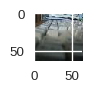

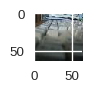

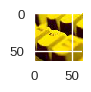

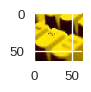

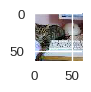

...

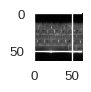

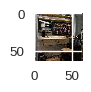

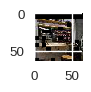

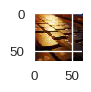

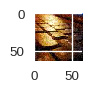

KeyboardInterrupt: ignored

Exception ignored in: 'zmq.backend.cython.message.Frame.__dealloc__'
Traceback (most recent call last):
  File "zmq/backend/cython/checkrc.pxd", line 12, in zmq.backend.cython.checkrc._check_rc
KeyboardInterrupt


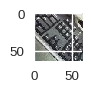

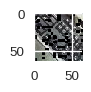

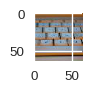

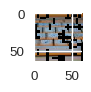

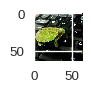

...

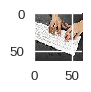

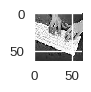

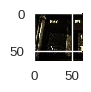

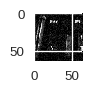

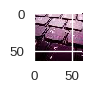

In [0]:
replace_original = 0
augment_image(seq=seq, TRAINING_IMAGES_DIR = TRAINING_IMAGES_DIR, replace_original = replace_original)

In [0]:
train_datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=seq.augment_image)


In [0]:
batch_size_v = 200
train_generator = train_datagen.flow_from_directory(
    directory=TRAINING_IMAGES_DIR,
    target_size=(target_size_v, target_size_v),
    #color_mode="rgb",
    batch_size=batch_size_v,
    class_mode="categorical",
    shuffle=True)

class_dict = train_generator.class_indices

Found 100000 images belonging to 200 classes.


In [0]:
VAL_IMAGES_DIR = './tiny-imagenet-200/val/images'
df = pd.read_csv(r'./tiny-imagenet-200/val/val_annotations.txt', sep = '\t', header = None, names = ['id', 'class', 'x', 'y', 'w', 'h', 'd'])
class_dict = train_generator.class_indices

val_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = val_datagen.flow_from_dataframe(dataframe=df, 
                                                     directory=VAL_IMAGES_DIR, 
                                                     x_col="id", y_col="class", 
                                                     class_mode="categorical",    #bbc -> seems to be a keras issue when "other is used" with y_col = class_idx
                                                     target_size=(64, 64), 
                                                     batch_size=batch_size_v,
                                                     shuffle=True)

Found 10000 images belonging to 200 classes.


### Training_1 (Number of epochs = 23)

In [0]:
from keras import optimizers
from keras.models import load_model


sgd = optimizers.SGD(lr=0.1, decay=1e-4, momentum=0.9, nesterov=False)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)

last_best_weights = r"/content/gdrive/My Drive/EIP/123C21/epochs:001-val_acc:0.6158.hdf5"
#last_best_weights = "/content/gdrive/My Drive/EIP/123C19/epochs:025-val_acc:0.3329.hdf5"



model.load_weights(last_best_weights)

model.compile(loss="categorical_crossentropy", optimizer=sgd, metrics=['accuracy', lr_metric])            #bbc: changed: reduced the learning rate

In [0]:
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto')
#reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, min_lr=0.0001)

def lr_scheduler(epoch, lr):
    #decay_rate = 0.1
    #decay_step = 3
    #if epoch % decay_step == 0 and epoch:
    #    return lr * decay_rate
    if epoch == 13:
      lr = 0.01
    elif epoch == 27:
      lr = 0.001
    elif epoch == 40:
      lr = 0.0001
    return lr

schedule_reduce_lr = LearningRateScheduler(lr_scheduler, verbose=1)


#callbacks_list = [checkpoint, reduce_lr]
callbacks_list = [checkpoint, schedule_reduce_lr]

In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=50,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        class_weight = class_weights_dict,
        verbose=1)

Epoch 1/50

Epoch 00001: LearningRateScheduler setting learning rate to 0.10000000149011612.
500/500 [==============================] - 1426s 3s/step - loss: 1.2934 - acc: 0.6656 - lr: 0.1000 - val_loss: 3.3447 - val_acc: 0.4013 - val_lr: 0.1000

Epoch 00001: val_acc improved from -inf to 0.40130, saving model to /content/gdrive/My Drive/EIP/123C21/epochs:001-val_acc:0.4013.hdf5
Epoch 2/50

Epoch 00002: LearningRateScheduler setting learning rate to 0.10000000149011612.
500/500 [==============================] - 1404s 3s/step - loss: 1.2474 - acc: 0.6534 - lr: 0.1000 - val_loss: 3.3113 - val_acc: 0.3978 - val_lr: 0.1000

Epoch 00002: val_acc did not improve from 0.40130
Epoch 3/50

Epoch 00003: LearningRateScheduler setting learning rate to 0.10000000149011612.
500/500 [==============================] - 1406s 3s/step - loss: 1.1985 - acc: 0.6524 - lr: 0.1000 - val_loss: 3.4439 - val_acc: 0.3770 - val_lr: 0.1000

Epoch 00003: val_acc did not improve from 0.40130
Epoch 4/50

Epoch 00004:

### Training_2 (Number of epochs = 4)

In [0]:
from sklearn import metrics
from sklearn.metrics import classification_report
import numpy as np
from keras.models import load_model
from keras import optimizers


sgd = optimizers.SGD(lr=0.01, decay=1e-4, momentum=0.9, nesterov=False)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)

#modelPath = '/content/gdrive/My Drive/EIP/123C21/epochs:023-val_acc:0.6200.hdf5'
modelPath =  '/content/gdrive/My Drive/EIP/123C22/epochs:009-val_acc:0.6286.hdf5'
model = load_model(modelPath, custom_objects={'lr':lr_metric})


In [0]:
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto')
#reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, min_lr=0.0001)

def lr_scheduler(epoch, lr):
    #decay_rate = 0.1
    #decay_step = 3
    #if epoch % decay_step == 0 and epoch:
    #    return lr * decay_rate
    if epoch == 5:
      lr = 0.0005

    return lr

schedule_reduce_lr = LearningRateScheduler(lr_scheduler, verbose=1)


#callbacks_list = [checkpoint, reduce_lr]
callbacks_list = [checkpoint, schedule_reduce_lr]

In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=4,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        class_weight = class_weights_dict,
        verbose=1)

Epoch 1/4

Epoch 00001: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [==============================] - 1541s 3s/step - loss: 0.7266 - acc: 0.8286 - lr: 0.0100 - val_loss: 2.0548 - val_acc: 0.6148 - val_lr: 0.0100

Epoch 00001: val_acc improved from -inf to 0.61480, saving model to /content/gdrive/My Drive/EIP/123C21/epochs:001-val_acc:0.6148.hdf5
Epoch 2/4

Epoch 00002: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [==============================] - 1538s 3s/step - loss: 0.7244 - acc: 0.8284 - lr: 0.0100 - val_loss: 2.0141 - val_acc: 0.6273 - val_lr: 0.0100

Epoch 00002: val_acc improved from 0.61480 to 0.62730, saving model to /content/gdrive/My Drive/EIP/123C21/epochs:002-val_acc:0.6273.hdf5
Epoch 3/4

Epoch 00003: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [==============================] - 1539s 3s/step - loss: 0.7187 - acc: 0.8306 - lr: 0.0100 - val_loss: 2.0606 - val_acc: 0.6149 - va

### Training_3 (Number of epochs = 4)

In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=4,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        class_weight = class_weights_dict,
        verbose=1)

Epoch 1/4

Epoch 00001: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [==============================] - 1540s 3s/step - loss: 0.7081 - acc: 0.8359 - lr: 0.0100 - val_loss: 2.0712 - val_acc: 0.6161 - val_lr: 0.0100

Epoch 00001: val_acc did not improve from 0.62730
Epoch 2/4

Epoch 00002: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [==============================] - 1539s 3s/step - loss: 0.7047 - acc: 0.8379 - lr: 0.0100 - val_loss: 2.0384 - val_acc: 0.6190 - val_lr: 0.0100

Epoch 00002: val_acc did not improve from 0.62730
Epoch 3/4

Epoch 00003: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [==============================] - 1538s 3s/step - loss: 0.6977 - acc: 0.8402 - lr: 0.0100 - val_loss: 2.0566 - val_acc: 0.6096 - val_lr: 0.0100

Epoch 00003: val_acc did not improve from 0.62730
Epoch 4/4

Epoch 00004: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [=======

In [0]:
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=False, save_weights_only=False, mode='auto')
callbacks_list = [checkpoint, schedule_reduce_lr]

### Training_4 (Number of epochs = 1)

In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=1,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        class_weight = class_weights_dict,
        verbose=1)

Epoch 1/1

Epoch 00001: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [==============================] - 1539s 3s/step - loss: 0.6893 - acc: 0.8423 - lr: 0.0100 - val_loss: 2.0440 - val_acc: 0.6170 - val_lr: 0.0100

Epoch 00001: saving model to /content/gdrive/My Drive/EIP/123C21/epochs:001-val_acc:0.6170.hdf5


### Training_5 (Number of epochs = 6)

In [0]:
sgd = optimizers.SGD(lr=0.001, decay=1e-4, momentum=0.9, nesterov=False)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)

modelPath = '/content/gdrive/My Drive/EIP/123C21/epochs:001-val_acc:0.6170.hdf5'
model = load_model(modelPath, custom_objects={'lr':lr_metric})

In [0]:
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto')
callbacks_list = [checkpoint, schedule_reduce_lr]

In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=100,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        class_weight = class_weights_dict,
        verbose=1)

Epoch 1/100

Epoch 00001: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [==============================] - 1545s 3s/step - loss: 0.6869 - acc: 0.8442 - lr: 0.0010 - val_loss: 2.0409 - val_acc: 0.6212 - val_lr: 0.0010

Epoch 00001: val_acc improved from -inf to 0.62120, saving model to /content/gdrive/My Drive/EIP/123C21/epochs:001-val_acc:0.6212.hdf5
Epoch 2/100

Epoch 00002: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [==============================] - 1530s 3s/step - loss: 0.6829 - acc: 0.8459 - lr: 0.0010 - val_loss: 2.0499 - val_acc: 0.6183 - val_lr: 0.0010

Epoch 00002: val_acc did not improve from 0.62120
Epoch 3/100

Epoch 00003: LearningRateScheduler setting learning rate to 0.009999999776482582.
500/500 [==============================] - 1519s 3s/step - loss: 0.6794 - acc: 0.8464 - lr: 0.0010 - val_loss: 2.0476 - val_acc: 0.6159 - val_lr: 0.0010

Epoch 00003: val_acc did not improve from 0.62120
Epoch 4/100

Epoch

### Training_6 (Number of epochs = 4)

In [0]:
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto')
callbacks_list = [checkpoint]

In [0]:
from sklearn import metrics
from sklearn.metrics import classification_report
import numpy as np
from keras.models import load_model
from keras import optimizers

sgd = optimizers.SGD(lr=0.0001, decay=1e-2, momentum=0.9, nesterov=False)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)

modelPath = '/content/gdrive/My Drive/EIP/123C21/epochs:006-val_acc:0.6270.hdf5'
model = load_model(modelPath, custom_objects={'lr':lr_metric})

In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        #initial_epoch=121,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=100,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        class_weight = class_weights_dict,
        verbose=1)

Epoch 1/100

Epoch 00001: LearningRateScheduler setting learning rate to 0.0005000000237487257.
500/500 [==============================] - 1485s 3s/step - loss: 0.6455 - acc: 0.8587 - lr: 1.0000e-04 - val_loss: 2.0169 - val_acc: 0.6257 - val_lr: 1.0000e-04

Epoch 00001: val_acc improved from -inf to 0.62570, saving model to /content/gdrive/My Drive/EIP/123C22/epochs:001-val_acc:0.6257.hdf5
Epoch 2/100

Epoch 00002: LearningRateScheduler setting learning rate to 0.0005000000237487257.
500/500 [==============================] - 1462s 3s/step - loss: 0.6441 - acc: 0.8592 - lr: 1.0000e-04 - val_loss: 2.0013 - val_acc: 0.6275 - val_lr: 1.0000e-04

Epoch 00002: val_acc improved from 0.62570 to 0.62750, saving model to /content/gdrive/My Drive/EIP/123C22/epochs:002-val_acc:0.6275.hdf5
Epoch 3/100

Epoch 00003: LearningRateScheduler setting learning rate to 0.0005000000237487257.
500/500 [==============================] - 1463s 3s/step - loss: 0.6436 - acc: 0.8597 - lr: 1.0000e-04 - val_loss: 

KeyboardInterrupt: ignored

### Training_7 (Number of epochs = 14)

In [0]:
!rm -rf "tiny-imagenet-200"           ### Run only when need to remove the downloaded images and download again

In [0]:
download_images(r"http://cs231n.stanford.edu/tiny-imagenet-200.zip")

Images already downloaded...


In [0]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random


def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])


def augment_image(seq, TRAINING_IMAGES_DIR, replace_original):
  #try:
    c_count = 0
    i_count = 0
    for class_type in os.listdir(TRAINING_IMAGES_DIR):
      count = 0
      c_count += 1
      if os.path.isdir(TRAINING_IMAGES_DIR + class_type + '/images/'):
        class_dir = os.path.join(TRAINING_IMAGES_DIR, (class_type + '/images/'))
        class_images = os.listdir(class_dir)
        for i, image in enumerate(class_images, 0):
          image_file = os.path.join(class_dir, image)
          count += 1
          i_count +=1 
          #image_data = imageio.imread(image_file)
          image_data = mpimg.imread(image_file)
          if len(image_data.shape) == 2:
            #fnd_count += 1
            image_data = np.stack((image_data,)*3, axis=-1)
          image_aug = rgb2gray(image_data)
          #image_aug = seq.augment_image(image_data)
          #image_aug = seq.augment_images(class_images[i])
          x = random.randint(0, 100)
          if replace_original:
            
            if x < 35:
              imageio.imwrite(os.path.join(class_dir, class_images[i]), image_aug)
          else:
            #imgaug.imshow(np.hstack([image_data, image_aug]))
            print(image_data.shape)
            imgaug.imshow(image_data)
            if x < 35:
              imgaug.imshow(image_aug)
          #imgaug.imshow(image_aug)

          #count += 1
          #if count == 5:
          #  break
    print("Total classes: ", c_count)
    print("Total images augmented: ", i_count)
  #except:
    #pass

In [0]:
replace_original = 1
augment_image(seq=seq, TRAINING_IMAGES_DIR = TRAINING_IMAGES_DIR, replace_original = replace_original)

In [0]:
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto')
callbacks_list = [checkpoint]

In [0]:
from sklearn import metrics
from sklearn.metrics import classification_report
import numpy as np
from keras.models import load_model
from keras import optimizers

sgd = optimizers.SGD(lr=0.0001, decay=1e-2, momentum=0.9, nesterov=False)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)

modelPath = '/content/gdrive/My Drive/EIP/123C22/epochs:009-val_acc:0.6286.hdf5'
model = load_model(modelPath, custom_objects={'lr':lr_metric})

In [0]:
from imgaug import augmenters as iaa
import imgaug
import os
import imageio
import numpy as np
from scipy import misc

In [0]:
seq = iaa.Sequential([iaa.SomeOf((1, 3), [
      iaa.Fliplr(1),
      iaa.CoarseDropout(0.1, size_percent=(0.10, 0.35)),
      iaa.Crop(percent=(0, 0.10)),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Add((-40,40), per_channel=0.5),
      iaa.CropAndPad(percent=(-0.20, 0.20), keep_size=True),
      iaa.CoarseDropout(0.1, size_percent=(0.10, 0.35)),
      iaa.Noop(),
      iaa.Fliplr(1),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Noop(),
      iaa.Add((-40,40), per_channel=0.5),
      iaa.CoarseDropout(0.1, size_percent=(0.10, 0.35)),
      iaa.AdditiveGaussianNoise(scale=(10, 18)),
      iaa.Noop()
      ], random_order=True), iaa.Resize({"height": target_size_v, "width": target_size_v})], random_order=False)

In [0]:
train_datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=seq.augment_image)


In [0]:
batch_size_v = 200
train_generator = train_datagen.flow_from_directory(
    directory=TRAINING_IMAGES_DIR,
    target_size=(target_size_v, target_size_v),
    #color_mode="rgb",
    batch_size=batch_size_v,
    class_mode="categorical",
    shuffle=True)

class_dict = train_generator.class_indices

Found 100000 images belonging to 200 classes.


In [0]:
VAL_IMAGES_DIR = './tiny-imagenet-200/val/images'
df = pd.read_csv(r'./tiny-imagenet-200/val/val_annotations.txt', sep = '\t', header = None, names = ['id', 'class', 'x', 'y', 'w', 'h', 'd'])

val_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = val_datagen.flow_from_dataframe(dataframe=df, 
                                                     directory=VAL_IMAGES_DIR, 
                                                     x_col="id", y_col="class", 
                                                     class_mode="categorical",    #bbc -> seems to be a keras issue when "other" is used with y_col = class_idx
                                                     target_size=(64, 64), 
                                                     batch_size=batch_size_v,
                                                     shuffle=True)

Found 10000 images belonging to 200 classes.


In [0]:
STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model.fit_generator(
        train_generator,
        steps_per_epoch=STEP_SIZE_TRAIN,
        epochs=100,
        validation_data=validation_generator,
        validation_steps=STEP_SIZE_VALID,
        callbacks=callbacks_list,
        class_weight = class_weights_dict,
        verbose=1)

Epoch 1/100
500/500 [==============================] - 1233s 2s/step - loss: 0.6515 - acc: 0.8254 - lr: 1.0000e-04 - val_loss: 2.0136 - val_acc: 0.6276 - val_lr: 1.0000e-04

Epoch 00001: val_acc improved from -inf to 0.62760, saving model to /content/gdrive/My Drive/EIP/123C22/epochs:001-val_acc:0.6276.hdf5
Epoch 2/100
500/500 [==============================] - 1225s 2s/step - loss: 0.6499 - acc: 0.8266 - lr: 1.0000e-04 - val_loss: 2.0102 - val_acc: 0.6274 - val_lr: 1.0000e-04

Epoch 00002: val_acc did not improve from 0.62760
Epoch 3/100
500/500 [==============================] - 1222s 2s/step - loss: 0.6499 - acc: 0.8262 - lr: 1.0000e-04 - val_loss: 2.0212 - val_acc: 0.6240 - val_lr: 1.0000e-04

Epoch 00003: val_acc did not improve from 0.62760
Epoch 4/100
500/500 [==============================] - 1229s 2s/step - loss: 0.6504 - acc: 0.8261 - lr: 1.0000e-04 - val_loss: 2.0062 - val_acc: 0.6283 - val_lr: 1.0000e-04

Epoch 00004: val_acc improved from 0.62760 to 0.62830, saving model t

KeyboardInterrupt: ignored

## Evaluate the model -- with 62.99% validation accuracy

In [0]:
from sklearn import metrics
from sklearn.metrics import classification_report
import numpy as np
from keras.models import load_model
from keras import optimizers


sgd = optimizers.SGD(lr=0.0005, decay=1e-4, momentum=0.9, nesterov=True)
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        return optimizer.lr
    return lr

lr_metric = get_lr_metric(sgd)

modelPath = '/content/gdrive/My Drive/EIP/123C22/epochs:009-val_acc:0.6299.hdf5'
model = load_model(modelPath, custom_objects={'lr':lr_metric})

In [0]:
STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size

model_score = model.evaluate_generator(validation_generator, steps = STEP_SIZE_VALID, verbose = True)
print(model.metrics_names)
print(model_score)

50/50 [==============================] - 41s 817ms/step
['loss', 'acc', 'lr']
[1.9978990435600281, 0.6301999998092651, 0.0005000000237487257]
